# Импорт необходимых библиотек и загрузка тестовых данных

In [1]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch import autograd as ag
from IPython.display import clear_output
import os
import seaborn as sns
import time
from sklearn.metrics import confusion_matrix, accuracy_score
import hiddenlayer as hl

ModuleNotFoundError: No module named 'torch'

In [2]:
train_path = "cifar_data/train/"
test_path = "cifar_data/test/"

In [3]:
with open(test_path + 'test_batch', 'rb') as fo:
    dict_ = pickle.load(fo, encoding='bytes')
labels = dict_[b"labels"]
data = dict_[b"data"].reshape((-1,3,32,32))

In [4]:
labels_dict = {0:"airplane",
1:"automobile",
2:"bird",
3:"cat",
4:"deer",
5:"dog",
6:"frog",
7:"horse",
8:"ship",
9:"truck"}

# Можно ли запустить на видеокарте? (на сервере нельзя)

In [5]:
is_cuda = torch.cuda.is_available()

# Генератор батчей

При использовании стандартного (пакетного) градиентного спуска вычисляется градиент для всей обучающей выборки, а потом делает единый шаг оптимизации. Однако, это во-первых долго, во-вторых, если мы работаем с картинками или просто с большими объемами информации, то вся выборка может просто не поместиться в оперативную память. Чтобы решить проблему используется метод стохастического градиентного спуска. 

В методе стохастического градиентного спуска мы вычисляем градиент и выполняем маленький шаг оптимизации для одного случайного элемента обучающей выборки (по сути, сокращаем объем обучающей выборки до одного элемента). Но тут тоже есть проблемы. Во-первых это долго (опять), во-вторых случайный элемент выборки может оказаться странным и дать градиент куда-то не туда. Да, конечно за большое количество шагов мы в среднем будем идти скорее всего туда, куда надо, но хотелось бы действовать каждый раз ну хоть немного осмыслено.

Для этого используется мини-пакетный градиентный спуск (mini-batch gradient descent). По сути, мы комбинируем подходы, которые были описаны выше. Мы используем небольшую подвыборку исходной выборки для того, чтобы посчитать градиент по ней. Так мы и направление сделаем в большинстве случаем чуть более адекватным, и скорость немного увеличим.

Напишем ***генератор*** батчей.

In [6]:
def batch_generator(path, batch_size=10):
    for file_name in os.listdir(path):
        with open(path+file_name, 'rb') as fo:
            dict_ = pickle.load(fo, encoding='bytes')
        label = dict_[b"labels"]
        data = dict_[b"data"].reshape((-1,3,32,32))
        if is_cuda:
            for i in range(0,len(label),batch_size):
                yield (torch.tensor(data[i:i+batch_size], dtype=torch.float32).cuda(), torch.LongTensor(label[i:i+batch_size]).cuda())
        else:
            for i in range(0,len(label),batch_size):
                yield (torch.tensor(data[i:i+batch_size], dtype=torch.float32), torch.LongTensor(label[i:i+batch_size]))

def test_batch_generator(path, batch_size=10):
    with open(path + 'test_batch', 'rb') as fo:
        dict_ = pickle.load(fo, encoding='bytes')
    label = dict_[b"labels"]
    data = dict_[b"data"].reshape((-1,3,32,32))
    if is_cuda:
        for i in range(0,len(label),batch_size):
            yield (torch.tensor(data[i:i+batch_size], dtype=torch.float32).cuda(), torch.LongTensor(label[i:i+batch_size]).cuda())
    else:
        for i in range(0,len(label),batch_size):
            yield (torch.tensor(data[i:i+batch_size], dtype=torch.float32), torch.LongTensor(label[i:i+batch_size]))

# Соревнование ImageNet

*Материал из википедии:*

*База данных ImageNet — проект по созданию и сопровождению массивной базы данных аннотированных изображений, предназначенная для отработки и тестирования методов распознавания образов и машинного зрения. По состоянию на 2016 год в базу данных было записано около десяти миллионов URL с изображениями, которые прошли ручную аннотацию для ImageNet, в аннотациях перечислялись объекты, попавшие на изображение, и прямоугольники с их координатами. База данных с аннотацией и URL изображений от третьих лиц доступна непосредственно через ImageNet, но при этом сами изображения не принадлежат проекту. С 2010 года ведётся проект ILSVRC (англ. ImageNet Large Scale Visual Recognition Challenge — Кампания по широкомасштабному распознаванию образов в ImageNet), в рамках которого различные программные продукты ежегодно соревнуются в классификации и распознавания объектов и сцен в базе данных ImageNet.*

В соревновании в качестве целевой метрики выбрана Top-5 Accuracy. При этом алгоритм предсказывает 5 наиболее вероятных классов, к которым может относиться изображение. Если среди этих 5 классов будет тот, который является истиной меткой, то считается, что алгоритм угадал. До 2012 года применялись подходы, связанные с построением визуального мешка слов и другого поиска признаков на изображении. Признаки извлекались практически вручную, а затем использовались алгоритмы классификации. C 2012 в соревнование с ноги врываются сверточные нейронные сети, при чем резко опустив процент ошибок с 26% до 16%. Так началась Эра Диплернинга. В 2015 нейросети преодолели следующую границу -- human level. В аналогичной задаче человек совершает примерно 5% ошибок, тогда как нейронная сеть показала 3.6%. Сейчас лучшее качество модели 2.3% ошибок, показанные алгоритмом Squeeze-and-Excitation Networks. Впрочем, данные могли уже устареть. Качество разных моделей показано на рисунке ниже, но данные заканчиваются 2016 годом. Более свежей картинки я, к сожалению, не нашел в хорошем качестве и с адекватными подписями, а заниматься разведением шакалов я не очень хочу.

<img src="
uhShPkyRTD2ez2e/p/6Yr5Gviy6bKkAOBW0fgjsWCfZrkeSHWQoXFgfv37z/8A300XJID77/5+M1HnHz/yzdvfiBlX3z85icyddlQF2IgcPsIzEsObLacnq/40+YAZbvXQj/90ZcfZ+T7n3/2ozdvvhCe/+a9L3+UKRKwTlxA4MQR2GyEgekuSRYUD5J0WRrczYH3ye0/e3N5+TH9L68fMCV++lOZKVUhBQROFYE0K4riUBR72hBkyZwycmcg7O3mALv6z99cfp59Lp3+8vKLzyj1JpPZU+017AICHgK8NlpzBLDejIashcjVP6KJ/6Ps48+y98R+4A2HgC/AAQ9iCM4AgdTaJEhzg+LAex8zD764fP/jn5P3XwoO/AQcOIMBh4kBCIRw4Efv0Z7gI/Z58XH55j1KfgkOBMCLImeAQAAHBAUuf5DRC1I5+f/k5xwMmAh0nUEfYSIQaEOgmwOSApeX7338/ufvvbn8yZvL9+k10Q8++xIcaAMWz84GgW4OZOKiddB7Wfaj98X8/9HPs0y/KT2bnsJQIFCPQDcH5HTPn/xNweVPhfOb96RYC9XjCun5INCHA0yBj9Q2gNPiOp+uwlIgUItAXw58LoKBJgDda7VCCATOB4G+HLC8XybPp6uwFAjUIgAO1MIC4YQQAAcmNNjoai0C4EAtLBBOCAFwYEKDja7WIgAO1MIC4YQQ6OZA9WVo5c3QhLBCV8eJQDcHKj6vsoYZ44QFvZoQAn04YPzepsWEsEJXx4lAIAcs97eSzIVxwoJeTQiBQA7YM7+bnhBW6Oo4EQAHxjmu6FU4AuBAOFYoOU4EwIFxjit6FY4AOBCOFUqOE4FoDujXQ+OEBb2aEAIBHNDe7r4P0rkJYYWujhOBAA5ob5d/T2xyKjFOWNCrCSHQhwPK6924MCGs0NVxIhDBATcSjBMW9GpCCIADExpsdLUWAXCgFhYIJ4RAIAfcPYC9GpoQVujqOBEI5IDt9ToteTFOWNCrCSFwBAckFyaEFbo6TgQ6OdC8CgIHxukSk+tVJwf0ykfdJSUsYkwOMXR4bAj05UCFEvg7srE5xAT7Aw5McNDRZQeBHhywFkBWNHC0IQMEzg+BHhywHN9Knl+XYTEQcBAABxw4kJkgAkEcqF8FyWAwQczQ5XEhEMQBa+lTJhUxxgUHejNBBOI5oNgwQczQ5XEh0JsD1XXRuOBAbyaIQG8OlIshmZogZujyuBAAB8Y1nuhNfwS6OGAtfaykFQz6N4kaQOCmEZhviuU6yTfFQrRsEiLXxQHL2+uTN90btAcE+iOwYALMlsm24LomIRVFcqCMCf3tQQ0gcAsIbPM8TZKMWzYJSs9ms9/T/01X/cRfkf6xqTbkQOC2EbhjcW2fFpoDJiEfB8WBctavEICyVitIAoGTRWCzTYzrm4S0NogDvueXkpPtNAwDAiUCmw0tgfIkXSbJQif0094cqMYErQh3IHC6CKRZURRz+n/NWwKV0Ob25kAZAWRKK8IdCJw8AvxmdE2hgGKBdR3BARkRLF1IAoHTRyCdV23swYHqKghxoAom8meJQA8OVFdB4MBZjjiMriIADlQRQX5qCARwoH4NpKPC1ABDf0eHQAAHtLebu0OK0SGCDk0NgRgOGDJwYmqAob+jQwAcGN2QokM9EQAHegKG4qNDIJQDcg9g7wRUenSIoENTQyCUA84ewM5MDTD0d3QIgAOjG1J0qCcCnRywlz/2/K/TPdtDcSBwagh0ckD7etP91DoEe4BATwRiOOCEhp7toTgQODUEYjjghIRT6xDsAQI9EQAHegKG4qNDABwY3ZCiQz0RCOaA2ATYOwGV7tkeigOBU0MgmAPOJsDKnFqHYA8Q6IlAAAfsyd9yfpXs2R6KA4FTQyCAA77f25JT6xDsAQI9EQAHegKG4qNDIIYDzuJodIigQ1NDIIYD9lIIf0c2NY8ZX3/BgfGNKXrUDwFwoB9eKD0+BEI5IPcA9k5ApccHCXo0MQRCOeDsAezMxPBCd8eHQCcH7Knf9n2dHh8k6NHEEOjkgPb1pvvE8EJ3x4cAODC+MUWP+iEQwwFnedSvOZQGAieHQAwHnGXRyfUIBgGBfgjcEgf+z7cCrr/p1xWUBgJRCNwSB751EXB9O6pHqAQE+iEQygG5B3B2AjLTrzldGhzQSOB+6wiEcsDZA9iZuB6AA3G4odYACHRzwJn7be+X6TibwIE43FBrAAS6OeC7vSOJswkciMMNtQZAABwYAFSoPCsEYjjgrI7ieos4EIcbag2AQAwHsBYaYCCg8tYQAAduDXo0fCIIgAMnMhAw49YQCOOA2AE424DLS5WNsxz7gTjcUGsABMI44OwA3EycTYYDb5/woYnHH1xdvTCnJ66uZBJnJeLARS0fgcVymSSrLMvFo3xTLMoyt8uBF0/eycjfnz5/eXX1VnPg7XOW0QUOlOOE1FEILJazIknoP3HNlslWp0nQxYHKAsgsgUwwUGp73lQcuHr7iP39lZr4hec/fn4FDvSEE8U7EUjJ6ffpWpTL0yTJVI379+//yR/oo+Eyft6WaKjbIf4r4e70wRx4mj3VWbpfvRS8oNTfdijBYyDQjsD3S2owB/K8EGuhwuLAvXv3/u0hfdRdX33zdZvrm2dff/VNXfUO2V9qp2d/f5S9ep49U/uBp8+fag78XYcSPAYC7Qh86nIgSeYrltgcoGzXWsj4elOibKVPyuyJJQfeXjx+9Y6kxZMrERs4g/1AH0hRthUBjgNJku6SZEHxIElpi6yvOA5YuwStqN+9wgFyeDX5v0tU0HEAHOgHKko3I7Dcr5aHotjThiBL5kVRyJ2BqBDHASsoNDfb9sThwIvs0cXFu3IjfJWJ613EgTb48CwOgTlVW3MEsN6M9lkLWXO/RYHIf3fa4cDFs1ePnz6jd0PvyvdDiANxI4xaIQikTATnCokDDd4vvyl2tAVnFAc+4En/+cWjZ1n28jG9EnrG0z/WQsEwouB1IBDCAXva99JxRpg4IJyevigWd9oPi0vmsCeOwxa1eiLQlwNeTOjZnipe5YBw/UcyDEge0Cf2xHHgolY/BPpyYKA4IPz+qZr/NQnAgX5jidJxCJwSB7Tv6zs4EDemqNUPAXCgH14oPT4EIjlQbgviIKndD+j5X98RB+LARa1+CERyoNwW9GtOlwYHNBK43zoCnRxQM3458ZfuL1JxPQAH4nBDrQEQ6ORAxeW9bJxN4EAcbqg1AAL9OFATDeJsAgficEOtARDoxwEvClwee15I73/r7tgTDzDgUOkhAA54kEAwMQQiOKAXRPIehxfWQnG4odYACERwwF0QxdkEDsThhloDIAAODAAqVJ4VAiEc0IsfNwCoXFxvEQficEOtARAI4UCt72thnE3gQBxuqDUAAuEcaIgGcTaBA3G4odYACIRzQE/8lXucTeBAHG6oNQACkRwog0KcTeBAHG6oNQACfTlQOr+KB3E2gQNxuKHWAAj05UBlJYSzEgOMCVTeLAKdHPAm/goL4sxFHIjDDbUGQKCTAxWX97JxNoEDcbih1gAIgAMDgAqVZ4VAIAdqV0RCGNdbxIE43FBrAAQCOeAtgYwgziZwIA431BoAgRgOOEEhziZwIA431BoAgX4ccLxfhoI4m8CBONxQawAE+nHArIDKRJxN4EAcbqg1AAIj5MCDur9NrsoeDIAlVJ4nAuDAeY4brL4+BEI4ULMLOOW1EOLA9bnHJDSFcKB0eCuliRGH0pD7AXAgbkwmWyuaA5oOcciBA3G4odYACARzQM/72vf1Pc4mcCAON9QaAIFgDmifv5Q/xWeycTaBA3G4odYACERwwLi/SMTZBA7E4YZaAyAADgwAKlSeFQLgwFkNF4wdAIFuDjRthtWSKM4mrIXicEOtARDo5oC1/K+jQ5xNN8GBt0/kAQl9v3j6hK9XQvogzm7UGiECvThg0YGSkhFxmAzPgRdP3snY2/Wdko+v6HolpBcP4uxGrREicAQHJCPiMBmeA1dvHwlv13cx+9PHk5ci9SDObtQaIQKBHHBXQXYuDpPhOXBxITlQ3oXvv8hegANxYzbaWoEccFdBdi4OmVvjwEu1SXgQZzdqnSkCi+UySfJNsRD2m4TITYwDT7N3RRjAfuBMfTnS7MVyViSzZbItWIFJSG0T48DVO5IC4ECkM51ttbRI8jRJMu6ASVD63r17//aQPuqvr+0lT2P6q/rKHdK/VK7Yevu7DiUNj/9eKa3ZDzx+/oF6+PcNlSEeEwKflpQlDhSaAyZBj+/fv/8nf6CPhqvG7+3dsHzcULdD/Fetzq8e/m2HkobH/1rLgXevSPz2+WP18F8bKkM8JgS+380BDgX3y2LVlHRy3+0dblQrheWH3xN/kNH1/OJC36+ekfe/w0QQ14MwO1FqLAjwWihPUtoZL3RCd62bA47HWxnFDa2o3314Dmhn1/cn7P46ClxgP9BvvM6+9HK/Ws6LoljzlkAldKeCOdAUDrSifvcb58AjDgPW9aCfvSg9CgT4zeiaQgHFAusK5oAVAZykpatH8sY58LQMAYIJD3oYi6JjQiCdV3sTxQE7JlQVhuVvnANWCAAHwsZoMqWiOGAHgjikwIE43FBrAATAgQFAhcqzQgAcOKvhgrEDINCTA/ZOQK6I4mzCWigON9QaAIFODvheb+8GTvF3KR9U9791+QcDYAmV54lAJwekxzczIa7biANxuKHWAAgEcsCd+zmnWRFnEzgQhxtqDYBANAc0K+JsAgficEOtARAABwYAFSrPCoEIDuhVkIwEcb1FHIjDDbUGQCCCA3oVBA4MMB5QefMI9OGAGwAUFeJMRhyIww21BkCgDwfcAAAODDAcUHkLCARwoHb6N3yIsxlxIA431BoAgQAOGHevJCQ34mwCB+JwQ60BEDiCA5IScTaBA3G4odYACIADA4AKlWeFQBQH7B1CXG8RB+JwQ60BEAjlgO32zr4gziZwIA431BoAgVAOKL/3qRBnEzgQhxtqDYBATw44IUBk4mwCB+JwQ60BEAAHBgAVKs8KgU4O+KsfNxbE9RZxIA431BoAgU4OuB7v5+JsOlcOPPh2wPU3cZig1i0hEMsBEx7i7D5XDny77m+Tq7JvxWGCWreEQCwHTECIsxsciMMNtQZAABzoBSriQC+4zqNwGAfkysf+RByoroDKPNZC5+H72sowDhiP9xNaUb871kL98ELpAREAB3qBO+Ra6FshVy9rUTgIAXAgCCZdaEgOlIuplpQ2BPfrQwAc6IUlONALrvMoHM0B/QVBXDexH/Bxa5n9y0d+NUiORaCTA9rX/d2wlMQZAA74uJWO3pLyq0FyLAKdHGjyfS2PMwAc8HFr8fzykV8NkmMRAAd6IWj2A0+f8PVKOufTq5dXL0o/jfx+oFTQkuplLQoHIRDIAevrscriKKgVr9DZx4HHV3S9yqS3vvOSko+M54ID3niftCCQA3rl49/jenf2HBAO/+Sl9Pun9OvfGf8GuLzAgTinuK1a4EAv5M1aiL39RVYugB5lbxUDLi7AgV6Y3nphcKDXEDgcePlEuf3Tq6t3yjAADvSC9PYLR3NAbwviujCGtdDT7F3FAdocPHlWxgTEgTinuK1a0RzQO4M4w8fAgat3zOqHEk+emdzxHHj8wZV80eS8fuIG4uBGrTYEwIE2dLxn1lro8fMPjNdT4uoaOfD0+curK7G/cF4/gQPeeFyLIIADetWjZ373HmfFCOLA2+eP2Snfvbp4cfX04tFz9Y6IREfHgVfW5oL06ddP3Fwc3KjVhkAAB1yfr+balDc/GwEH1C6Y5v/HL59nz18JRrCbHs2Bpxm9bC0v+/UTONDsU9FPQjlgfUlmfpZV0CGu5RFwQPn8EzFnO057bBx4lL16npV7bPP6iWkRBzdqCQRWWZaLRL4pFiUmoRyoTv8mX6rqkxoBB+RE/ajcBpiZ+3gOvL14/ErvuMvXT+BAHxerKVso2WyZbHWaROBADVbNImtPLF3+abkEukYOkKpH6hzGhfv6qdk0POlEYJ+uRZk8TZJMlZ7NZr+n/5suM9e3Jf7YVLtV/tfGYVoS/9iqovHhP7eoNI/+ubF664N/NApaEn/dqqLxodH4gs8evas4UHn91Fi79cH/+C8B1/9qVXGWD++4tMjzQqyFCosDVOKIOCC3CG4robnRrIWM41qJY9dCF89ePX76jPYZ9M7pQr1+0upDAXbL/bu7Ade/d+uMMjdfcbeujwMyOsRBBQ74uGk3p3XQsyx7SYss/s7BPoRBJfxqIRJwQKGU7pJkkeR5ki5L3I6IA+BA6bVO6ug4QMdQhUJ+51TZb5Qj1ycFDjBah6LY04YgS+ZFUcidgQCxkwPt35BdXvYZirIs4kCJhU45POJM3TsnXbjfHRyQeM3ptuYIYL0ZPWo/gDjgea0UXEMcEIrq3jn1831dGhzQSCRJykRwrs44ID298SsyxAGfCNfFAV8z9gOO815TJpADkgl1n3F2YC3k41bn8p7MrxYiQRxoQwkcaEPHe+Z9R+Y5KQkQBzzcTloQywGzVY7rHeKAj1sdnTyZXy1EgjjQhlIsB8yyqE158zNwwMfG8/c6gV8tRAIOtKEEDrSh4z3DWsiD5PwF4ECvMTx/DvzwQ7p+KI9O/OJXr1WK81M4K1E72N0cMCt/s/xxErVaO4VYC/kQ1S19PJlfLURirYVef/j69es/Exx4/ae/+5esJAE4UAOl4+tNmZp6ASJwwAfJ8/c6gV8tRGJz4LWMAXfv/jr79d27H36os4gDdUhW3d7+osw8q6vYLQMHfIzqXN6T+dVCJLUc+MWPyf1fZ+BA91rIeLuXEJwIGQK/DDjgY+L5e53ArxYisTmQZdmvPmHHf80h4BdHc+BBnZlVWeRXJiF9O77MMRwQpIgzARzwcav6TW3erxYisTjwZ5/c/fVvfmU48ENwIPRvaJo3xiFD4JcBB3xMan2+KvSrhUgsDgjv51XQ3dd/Sh+/AwdCOeCtg4wgZAj8MuCAj0nV3WvzfrUQSS0HfvgbTQRmRPS70cmuhcq4EDIEfhlwwMek1uerQr9aiKTkwCe/+OTub3/8+u4PX9/9hG6//vHvhP+DAw0wmrm+LdFQt0MMDvgAVd29Nu9XC5FYHPhVlv34X+RC6Le/ybLXhgKx70aHjAPfDrlCAGgtgz1xKzzVh+f/PfHdu+Kl0IfC+eV3ZYoGkd+RDcmB2mmgKqyOUe98NwfKZU9tOOjdoqiAOODjVh3b2rxfLURSxgHl77/l/XDlAgdqoPR8vo4ONfUCROCAD1Ktz1eFfrUQiccBekPqXeBADZQeB4SgQoSaegEicMAHqerutXm/WojE44BHABKAAzVQ1nOgIq2pFyACB3yQan2+KvSrhUjAgTaUuvcDFZ+vZtuUNz8DB3xsqu5em/erhUhuhgPOzzSbn9IR3Yg8K1ELQVUYAkBrmUAOVBZARAQtadXe+BAc8KGpjm1t3q8WIrkZDtg/01z+lI7oxhg4UJ39y3zIEPhlwAEfk1qfrwr9aiGSm+GA/TPNlZ/SAQf8YQIHfEyq7l6b96uFSG6GA2Sw/pnmyk/pnOA/tWHBFrgWKuf9asrS1SMJDvhg1fp8VehXC5HcDAesn2mu/JQOOFAzSuCAD0rV3WvzfrUQyc1wwPqZZo4H5U/pnOI/uWTB1h0H9Oa3GgBU3tLVIwkO+GDV+nxV6FcLkdwMB9hW9TPN4ld0zE/pXAMHnHdOb5/YsIQA0FqmmwOl70s2VDjRqr3xITjgQ2OPa2Pa2De7OAAADnNJREFUrxYiuTkOqJ9pdn5Khzpz9J7Yeuf04sk7+neqBEwhALSW6cOBkg1WqlV740NwwIem0e/tB361EMmNcMD8TDP/fI7+KR1l+9EcsN45Xb21AgzpDwGgtUw0B3Q4aNXe+BAc8KGxXb0x7VcLkdwIB8zPNHMs0D+lc10cID36nROnbHxCAGgtE80BHQpatTc+BAd8aOxxbUz71UIkN8IBsln+TLP8yWbnB3SOjwNXV+WvUoEDXYMedKD9QZeW+udj+PuBuvNyLLuuM3N1P59zNAesd063FQf0ykfP/uW93le6pIgDPkKNc7/9wK8WIrmpOCAsrfv5nKM5wJrVO6fb4kDp89VUyBD4ZcABHxPb1RvTfrUQyY1yoM72a+GAeucEDnQPOdZCHkZnzwHnnRP2xN4AVwXgQBWR5Ow5YL9z+oD+pbzseRltvN72FXS+F6ruBETeEvZtUJbHWsjHrRzVlpRfLURy9hwgROx3Tg5AIQC0lunkgLX+tzy/lLZqb3wIDvjQOAPblPGrhUjGwAGBSN07pxAAWsv04UDp+CIlKdGqvfEhOOBD0+T2jtyvFiIZDQfq3jmFANBa5ggOSEq0am98CA740Di+3pTxq4VIRsOBOlhCAGgtAw60wlN9iO/IqogkQa8gruXdaB0BSOZZ1FcADvRCDBzw4JoMB2q3w2Ix5GESJMBayIepYZpzxX61EAnWQm0oIQ60oeM9QxzwIJlMHKi8ErKyHiZBAsQBHyZ3wm/I+dVCJIgDAqV8UyzchMghDoT4kCmDOGCg0InziQOzZbIt2GyTkH3o5IC3ExCCUqqh6HdHHPDxapj5XbFfLUSCOMAo5WmSZE6CMnfu3PmvKX00XP8x5Gqo2yH+8+8EXP/UoaTh8V8EqP7OXzRU7hD/U4juP+9Q0vA4RPV3Gup2iP/ffw64/luHkobHQXDfEiT32ePNVWgOmAQ9ol798uG9huubr7/38OH3Hn6PPvk68H/0wQIt5exX33z1TYOGWYOcxF99N+D6h+b6D3/Z/OzrANXf/bq5/s9+1vzsH0J0f9Vcvxnue/dCVH+3WfXPWiD55j8FXP+9WfcvWyAJgrsFklmjBx4NycOD8X9OGNc3Cfm4bS3kKIjIzCLqBFa5fy+wYESxO3ciKgVWGRDuOwNCcm9ASGbuZB0IZFCxipfkeZIuk2SRqITWMeCgJOCARtncB4QbHDAo60SFA/OiKNa8JVAJXWzAQQEHNMjlfUC4wYESZpWqcIBDQJKsKRSIhCn+6fdN8toTAwbQ73967dYahfeHC87JgHDfHxCSTweE5M5wHljrJencjDQSQAAIAAEgAASAABAAAkAACAABIAAEgAAQAAJAAAgAASAQgkDHe1V5MjtEkVOmQ6tTtvLdRuVZd7bSVqTFlXYqSp2n19OCo/KkM21YuIafKjLzw0yYtkjpG+Ukmaeck5+UmGWLNX+/sF4naSpL0MPDgnOUTTM6lVd31WnVMqGVKpFO+thXDlekrFEYofU2NqIKaL2yB8r0VH8rQj1YKGPptuhSphtNlFYHlmStDGNYBFwiT3qFH8h7cAumKcLbGQSNvm7NKtgjKbTMNQw9KnpFXeukczCk0vkJi9I3yrr+ODZ7S1mrTLmNKkjmygXLYteRSlf0b9jRSbucbhtyvl2W609WX+yJBnmyzjYp/2N3BXX7wDX+r8glyYrq1Fx1WrVMaiU9WUZulHJ71kXNbOl0hxbOc7KtoRFVS+uVPZAdWOzIPuGk3AN+ku1FB/IOZcYSpdWBJVlkyjBSuqShJ1y2yZrborlA30NbME0RCM4gyC5Q+NOtWSV7JAWyMYSstuFaJ11EgclFCQvjG2XVunHsg4zbqIKEXU97RtnU0al1nm6yJbvigkZ1vlpSI/KTVa+5yd1qXqzmXCKnIZ+vVofF7H8qWzarWgvqtCqZ1ppsdoJ0rEhEmAX57JqaWa3mggMy7PDjhkZUy05ba9GBZD2b56xd9YCpRiQW8LUrUzqpnsDFgYWGu5A6GJZZRgEsJ8h2q9ki3R70vctc04KVqOtC2ZpVsE9S9FdwgCbsBUXXtYi8PJMutlueINYklnN5q17HOuUiabZVcYCx0L4hB5K0piTS4yiFArhA7Nkap1E1qvNVsV4Ps546EAdymsgONKq0ViBPkZ9kyYzXOmm2l/2kElsS0TzNvWZLqZ6cbUXG+fC18tTPR5ek1vkq3xOBWNFytaemN1l6yA6UJ4kR8hTb0ohq0WrLmH6QFooeJOSgTGIu3myxUmZupNWFJc0WpdI592XHYZLx4E7Je58WTFMSGtWa6oJpzSrVJyn6yxzgBKlOs4JCPf1/WGf7HcV+IdgHqbQAls5BHFADzwBzC+wbciAPq/0uJxEJGS4hFOPYA3u2ympUQkJNhXA2qEeVQkvqRU5/bqZAY08RSbrzqCTJPsvmJNoVK1oLSRHn+EjqVhSoKBTZGq20fmB1UsUsW2/FQOQzui1XyWJFp1ypmS0FnUwLef5uaUQ1bLclTc+L1V5McdLcnDimTG62WCkzN9LqwrKTg6o6sMzmCxp3boAMp6Ly3oaJUe0n/C6Y1vzCQRKxQOFFGiNC1tFUlu4JzlVBQWFOUZIFNPGEKLOtE/pY+Urs5LjfyjfUQOYUyMlp5TjS3MCjK8axeyAdW+xGxajmGa2F9EzjFD02s+VFQy68nNxfupD8VIM9p5a5n8VGhn9GjXJ5TmEpZVHdVadVyKgww5Ysd7Tg5YHI86wodsRBWnuLASP4SiHPJI2NqIadtqTph7yQayHR1jqjv6pWJncpM51hrQ4sM7VIUx2gxdCW9gTUwCLfsMHy3m2uacFK+F0oW7OK9UmK/rKPMyJknbzREmtFCw3CXMglWl1qHetEPdqczlY7rscAK99QA5muVjlHXTGO9FyMLo8jlWvwljoDnEaFnRRZiMV1ZY+UzYSvcE9oJcJmenEgzw4KsWK1IC7bBZr2XHVapYzM5cbmHB2zFbdHXctzovcmE7N1nhAjjJBba2pE9dxtS3aAHtEiSrVFwy7oyoZ3KeMi4hJaHViWwmRWwmLqwXK/5zWQsJACl7yHt6Aa4ltNF8rWrHJ9kgIIZy3EVCAO0HD244BrnXIRVsTmMBbcFGGsB3KRr5ZCxC9YlJDRCcae9bqNis5wU9yD674OFBBpC7POlume5rmU2Ed9Ep/UFLm/mK0pArAVvMZeUAxM8/9NxXh3JbzBt6lOq5IprbR8Tmn9wOv/h0TvA69VZmrVToFWC5NseWhqRDXrtiVNn+V0JweVPZhR5+gSw9ChTOnkxSjj4sCyZh0b3pMxLLzQFYF5T+bTQNOKUd5DWzBN6cb0IMgulK1ZBfskRX+ZA4tsTy9UyjhAK/U5R0YuoEBp1esCLJ1jtrUBZi3kG/QfD+ThkO4EB3gcWc5CHsc+yLiNSkhSUrIS/05Kq729H27F5EbmrbId+bTMKRm/nstpel7QnFcItHYU/ta0Pdj9kYuQOZt6WtZp1TKplTYAnNjwa4V8l61oIhGvYfltI80wWkgNrJoaUX3VemUPpOkHel+5F5s27gEtsugSmhstrgKntDqw8NzP05mAhWcqfj2azHnG3lNkU/cOc6sNcb6uC6xZtlZXI0AmBuzAEYsw3GRrWpoQErwW4nc25Ess4P+7Ltc66SIzAngpNlwMsPYNOZDbFWFvxlGNLo9jH2TcRsUACieVo9plcuTz+pdku2Wy4Cf0wS41F6Xk10OinZV40dPcZKNW9RWT8FNZnXXT/+xW9kXSrkZUcacto4Z64FyBynQdR6kWJlKpQIZki7Uspe49WzBKKVHfml2iR1ooEzhIMMQAijboy7cFyZQgWKVjnQNw6RtGmXmuJFw5BhmnUaP9JhO862u5xDTT8rzhUYfWSq3IRpSWSlvHKdOWVZRqsbhfTwuOypPOtGHhGn6myHR8185fvURcHVorGiMbUVoqbR2nTFtWUarF4n49LTgqTzrThoVr+NSQcXuPHBAAAkAACAABICAROHaT17pBOy+Qj4Wi2tsRQVPt2qjyfNSYvi1qPPmiD06LTh97APm0keuAogsJp3N8zrzju1SnPDK3iAB9DVIes66xQ7xrV3L6kole35tvCcRB8j4HkGvUn5KoA4oWJBIJRdkZec68/ZB9WRqpW0WAvxMsj1m7psg/yJEuL76FLw8glwfJO06SuxpPOtcFheYA971EQp3PVhMDf80xp28n5Kn2HmezTxqZkRvHR43NMWv6XlUcQxS3BX3/Tuc75MjLU8iUprGm/2SWvy3lAwf8jdQIri4oFAdE3w0SDhR8XkV8+6zOmY8GmhGMbksX5Lkvecz6QIeu6ICwum2zOZ8zFiOvTiHTSQbvIHnPA8gtptz2oy4oJAf02WvnKDahRMfa6OKn9O2zOmcefi7+tvs+6fbVwKvj1ryPozOc4jZbHXgeEyOvTyHTebPqQXIq0OMA8ilj3QWF5ICEgtICCYqC8qA9B0faLdHfQayzmT5nPhpoTnnYjreNB14fs1bOr250JLIg71YcEMfJOV09SE4F4r6cP972a9bQBYXmAEOhkSAOyIP2hMwhp98aW67oFKw+Zz4aaK4Z6RNTJ45dq2PWDymgF9ma10J0y3dqH0x/nfRHeeCYR756kJy8YDQcoOPULVDIP3qSZ681EvootjyLTWM7y2gppM+ZjwaaE3PaazZH/EWyPmbNJ7Np6pc3OorN5+3pLR9tlOUpZHMAWWb5EHSvA8jXbPs1q+uCQiIhz14bJNRRbAkFGUR/iyWWhuKcecNJ/mu2G+qORUAdu1bHrS1ty30y5z9Ms6/qF5+xB5BtnaeT7gNFFQlzzFwfYOduxZzNPh04pmNJ41HjZbZcBmx3z/QAct0AHwtFVeeIoKl2bVz55qPGqfhXCrp6O6IDyMdCUYVqRNBUu4Y8EAACQAAI9ETg/wOO1HKdbSNTgQAAAABJRU5ErkJggg==" />

Можно посмотреть на различные нейросетевые архитектуры. В разных архитектурах содержится разное количество параметров, которые надо подбирать. Также разные архитектуры отличаются по количеству вычислительных операций, необходимых для работы архитектуры. Посмотрим на диаграмму, на которой изображены соответствующие параметры для различных архитектур, а также их качество. Здесь по вертикали указано качество модели на Top-5 Acc и Top-1 Acc, по горизонтали скорость вычислений, а размер кружка показывает количество параметров модели. Идеальная модель на данной картинке будет находиться в левом верхнем углу и иметь очень маленький кружок.

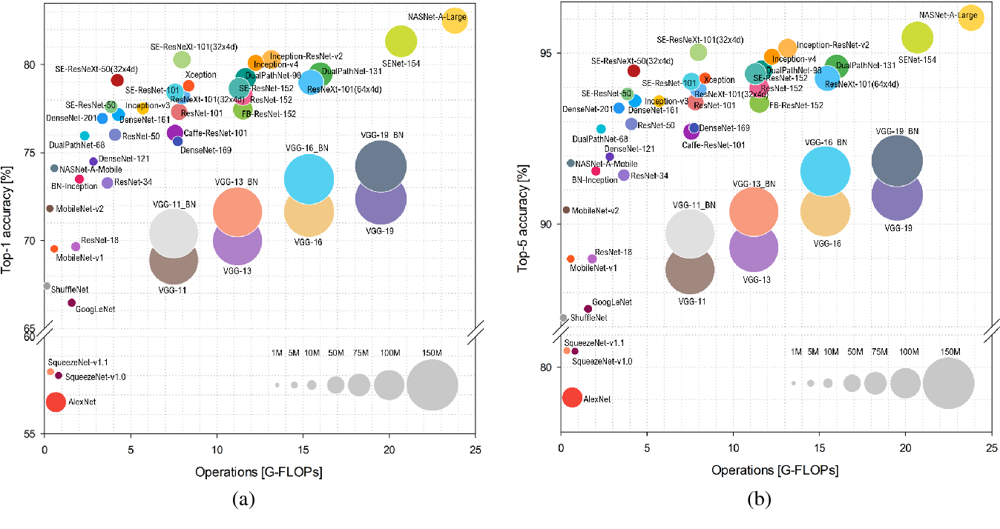

# LeNet (Yann LeCun, 1998)

Нейросетка, которая взорвала всем мозг, так как очень хорошо справлялась с распознаванием рукописных цифр (датасет **MNIST**) и заставила всех поверить в силу нейросетей. Ее даже начали применять в почте США для распознавания индексов. По сути, это была первая работа, в которой успешно были применены сверточные нейронные сети. Правда, потом о них на некоторое время забыли, но это уже другая история. О концепции вспомнили в 2012 году, когда сеть AlexNet выиграла соревнование ImageNet c отрывом от предыдущего результата почти в 2 раза. Это был первый случай, когда нейросети победили в этом соревновании. С тех пор ничего кроме нейросетей в топ не выходило. Развитием этих идей с большим количеством слоев стали модели VGG-16 и VGG-19.

<a href="http://yann.lecun.com/exdb/lenet/">Сайт автора</a>

<a href="http://www.dengfanxin.cn/wp-content/uploads/2016/03/1998Lecun.pdf">Статья о сетке</a>

Посмотрим на архитектуру сети и реализуем ее на PyTorch

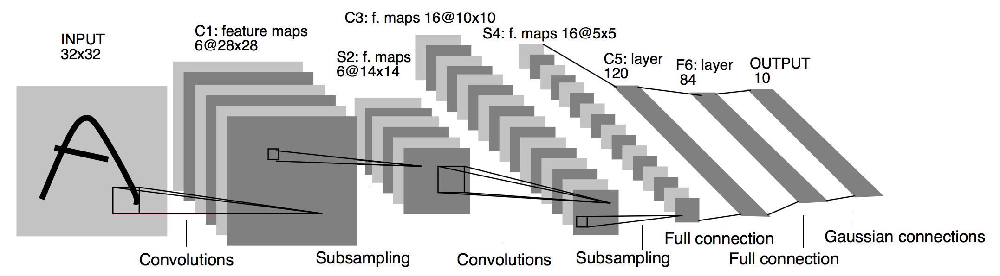

In [7]:
# Create LeNet Class
class LeNet(nn.Module):
    def __init__(self, image_size):
        # Initialize the super class
        super(LeNet, self).__init__()
        
        # Define model weights
        # We use Convolution + MaxPooling for each layer
        self.conv_1 = nn.Conv2d(3, 20, 5, padding=2)  # input channels: 3, output channels: 20, kernel size: 5
                                                      # padding = (kernel size - 1) / 2
        self.mp_1 = nn.MaxPool2d(2)                   # MaxPooling 2X2
        
        self.conv_2 = nn.Conv2d(20, 50, 3, padding=1) # input channels: 20, output channels: 50, kernel size: 3
        self.mp_2 = nn.MaxPool2d(2)
        
        self.conv_3 = nn.Conv2d(50, 100, 3, padding=1) # input channels: 50, output channels: 100, kernel size: 3
        self.mp_3 = nn.MaxPool2d(2)
        
        self.dense_1 = nn.Linear(16*100, 500)          # Fully-connected layer, 500 outputs
                                                       # input features = (32/2**(num MaxPool layers))*(num previous output channels)
        self.dense_2 = nn.Linear(500, 10)
        
    def forward(self, x):
        # layer 1
        h = self.conv_1(x)           # Apply convolution to input
        h = torch.relu(h)            # Apply ReLu nonlinearity 
        h = self.mp_1(h)             # Apply MaxPooling
        # layer 2
        h = self.conv_2(h)
        h = torch.relu(h)
        h = self.mp_2(h)
        # layer 3
        h = self.conv_3(h)
        h = torch.relu(h)
        h = self.mp_3(h)
        # flatten
        h = h.view(x.shape[0], -1)   # Reshape images to (batch size)X(num features)
        #hidden
        h = self.dense_1(h)          # Apply linear hidden layer
        h = torch.relu(h)            # Apply ReLu nonlinearity
        # output
        logits = self.dense_2(h)     # Apply linear layer
                                     # NO ACTIVATION NEEDED HERE!
        return logits

# Обучение модели

Напишем функцию, которая будет обучать модель. Писать будем сразу хорошо, с сохранением лучшей модели, уменьшением learning rate и построением графиков. Потом эту функцию будем использовать для обучения всех моделей.

In [8]:
def train(model, training_path, test_path, num_epo=10, batch_size=10, 
          weights_file="model.torch", checkpoint_after=1000,
          lr_start=1e-3, lr_deacy_rate=10, drop_lr_after=10):
    """
    Traininig the given model
    """
    opt = torch.optim.Adam(model.parameters(), lr=lr_start)          # Define the optimizer
    loss_f = nn.CrossEntropyLoss()                                   # Define loss function used
    
    # Service variables
    losses_train = []                                                # save training losses
    losses_val = []                                                  # save validation loasses
    i = 0                                                            # current iteration
    start = time.time()
    for epo in range(num_epo):
       
        cum_loss = 0                                                 # Zero the cumulative sum
        for (x, y) in batch_generator(training_path, batch_size):
            out = model(x)                                           # calculate model outputs
            loss = loss_f(out, y)                                    # calculate loss
            
            cum_loss += loss.data.cpu().item()                       # add current loss to cum_loss
            
            opt.zero_grad()                                          # zero old gradients
            loss.backward()                                          # calculate new gradients
            opt.step()                                               # perform optimization step
            
            
            i+=1
            if i%checkpoint_after == 0:
                val_loss = 0
                # measure loss on validation
                for (x, y) in test_batch_generator(test_path, batch_size):
                    out = model(x)
                    val_loss += loss_f(out, y).data.cpu().item()
                # add new data to lists
                losses_train.append(cum_loss/1000)
                losses_val.append(val_loss/1000)
                cum_loss = 0
                
                if np.argmin(losses_val) == len(losses_val)-1:      # if new loss is the best
                    torch.save(model, weights_file)                 # save model
                
                # if there was no improvement for drop_lr_after iterations
                if len(losses_val)-1-np.argmin(losses_val) > drop_lr_after: 
                    model = torch.load(weights_file)                # load the best model
                    lr_start /= lr_deacy_rate                       # reduce learning rate
                    opt = torch.optim.Adam(model.parameters(), lr=lr_start)
                    
                # plot losses
                clear_output(True)
                print(f"Epoch {epo}: trining loss={losses_train[-1]}; test loss={losses_val[-1]}")
                print(f"Learninig rate: {lr_start}")
                end = time.time()
                print(f"Iteration took {end-start}s.")
                
                start=end
                plt.plot(losses_train, c="r")
                plt.plot(losses_val, c="g")
                plt.show()
                
                # If the model could not get better even after lr decay, then stop training
                if lr_start < 1e-6:
                    print(f"Early stop at {i}")
                    return
                   
                

Параметры обучения были выбраны не наилучшим образом. Например, увеличение batch_size до 20 поможет проскочить локальный минимум и опустить ошибку ниже 0.6. Но я делаю для наглядности и красивых графиков, так что все модели буду обучать с этими параметрами.

Epoch 14: trining loss=0.1668774147927761; test loss=0.6454026073366403
Learninig rate: 1.0000000000000002e-07
Iteration took 23.562366485595703s.


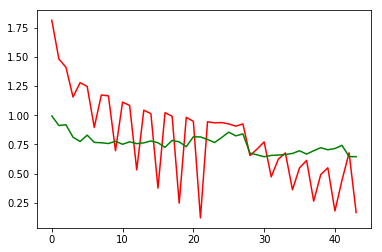

Early stop at 44000
Wall time: 17min 16s


In [12]:
%%time
model = LeNet(32)
if is_cuda:
    model.to("cuda:0")

train(model, train_path, test_path, 50, 16, "lenet.torch", lr_start=1e-3)

## Тестируем модель

Я загружу лучшую из полученных моделей и протестирую ее. Все модели будут тестироваться на одних и тех же данных. Слева будет картинка с метками, справа -- распределение вероятностей.

In [9]:
def test_model(model):
    idxs = [0,1,2,3,4,5,6,7,8,9,10,34,42,69,1337,1234,123]
    for idx in idxs:
        plt.figure(figsize=(10, 5))
        plt.subplot(1,2,1)
        pred = torch.softmax(model(torch.tensor(data[idx].reshape(1,3,32,32), dtype=torch.float32).cuda()), 1).cpu().detach().numpy()
        plt.title(f"True label: {labels_dict[labels[idx]]}\nPredicted label: {labels_dict[np.argmax(pred)]}\n")
        plt.imshow(np.rollaxis(data[idx],0,3), interpolation="bilinear");
        plt.subplot(1,2,2)
        plt.xlim(0,1)
        plt.barh(list(labels_dict.values()), pred[0]);

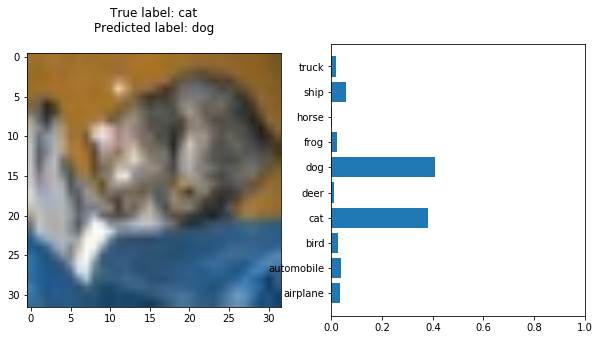

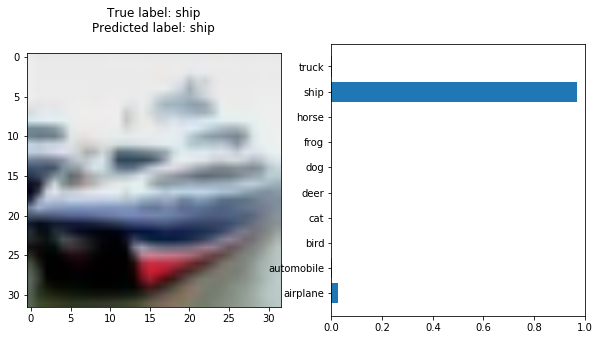

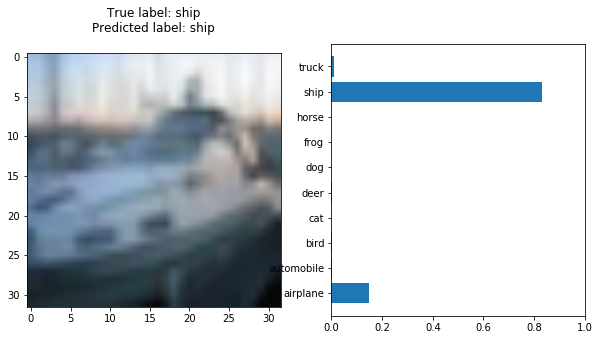

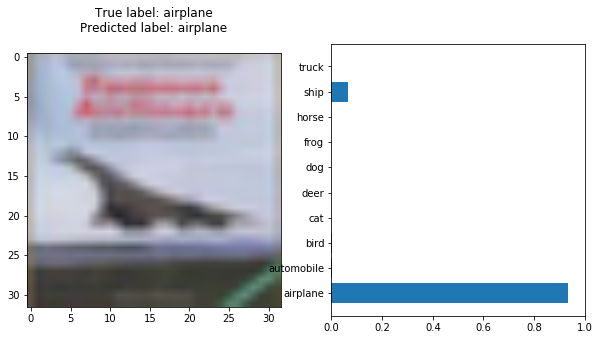

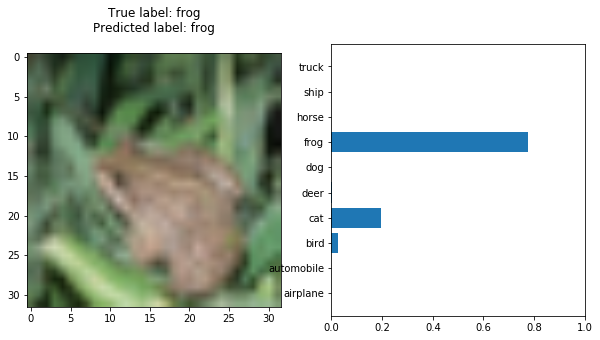

...

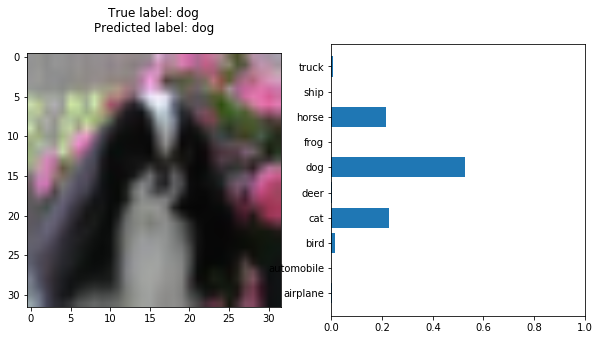

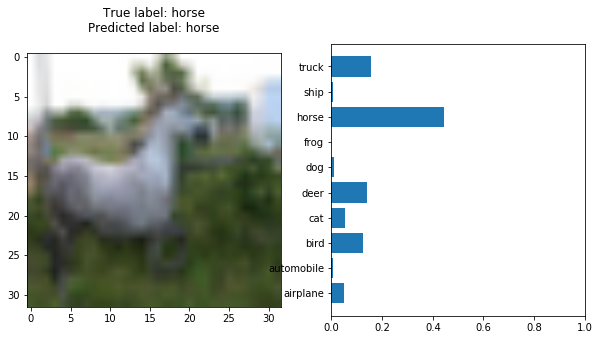

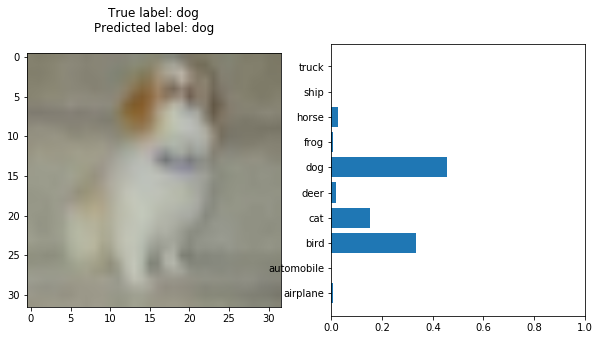

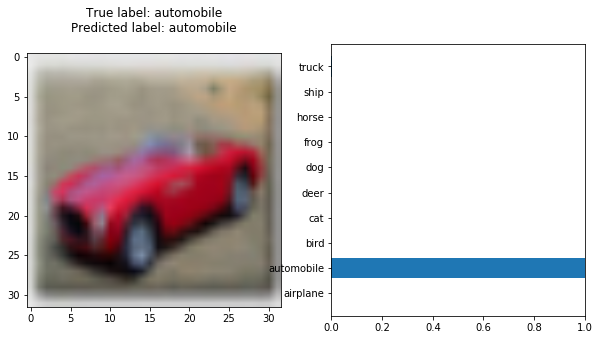

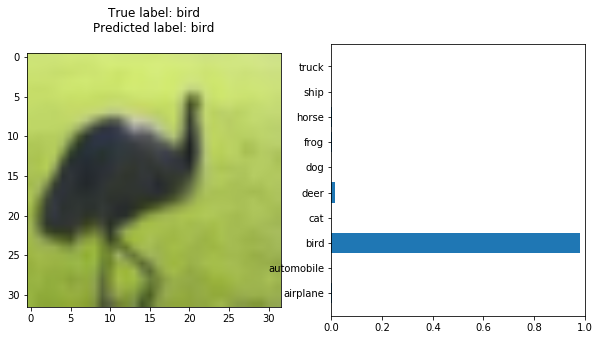

In [10]:
model = torch.load("lenet.torch")
model.eval()

if is_cuda:
    model = model.to("cuda")

test_model(model)

Дабы окончательно закрыть вопрос про качество модели, посчитаем Top-1 Accuracy на валидации, а также построим Confusion Matrix. При этом я обнулю правильные ответы, чтобы картина была нагляднее.

In [11]:
def plot_errors(model):
    pred = []
    for (x, _ ) in test_batch_generator(test_path, batch_size=20):
        pred += list(torch.argmax(model(x),1).cpu().numpy())

    print(f"Top-1 Accuracy: {accuracy_score(pred, labels)}")
    plt.figure(figsize=(12,10))
    sns.heatmap(confusion_matrix(pred, labels)*(1-np.eye(10)), annot=True);
   

Top-1 Accuracy: 0.6664


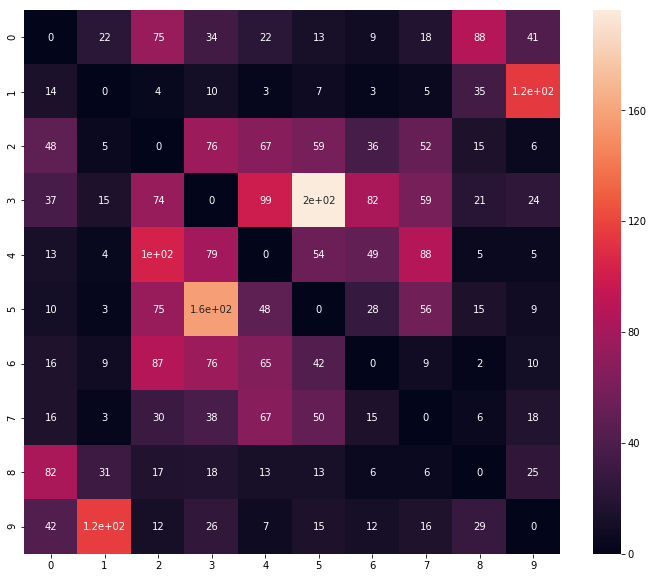

In [12]:
plot_errors(model)

# Отрисуем архитектуру модели

In [13]:
def plot_architecture(model):
    w = torch.zeros([1, 3, 32, 32])
    if is_cuda:
        w = w.cuda()
    return hl.build_graph(model, w)


(dot.exe:3620): Pango-WARNING **: couldn't load font "Times Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


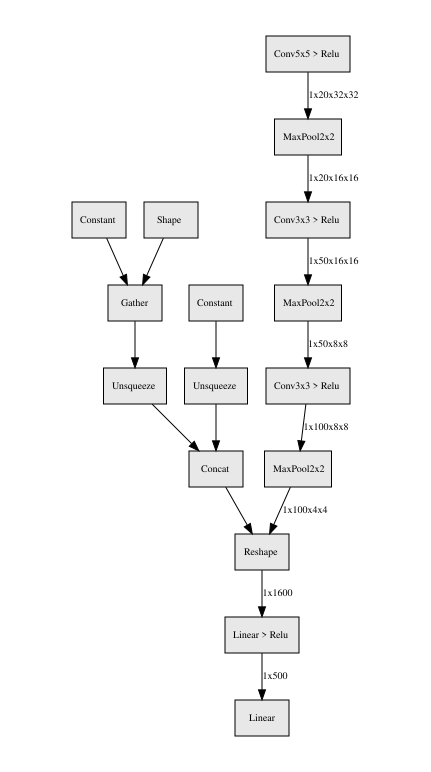

In [14]:
plot_architecture(model)

# Batch normalization

На картинке со сравнением различных моделей можно во многих местах увидеть приписку "BN-". Это значит, что в данной модели применялась операция нормализации батчей. Давайте разберемся, что это и почему это хорошо. Для этого давайте проведем мысленный эксперимент над Алисой и Бобом. Для этого закроем Алису и Боба в разных комнатах, но дадим им общаться по телефону. Затем покажем Алисе фотографии и попросим описать некоторые признаки изображенного объекта Бобу по телефону. Затем будем спрашивать у Боба, что было изображено на картинке, и, затем, говорить ему правильный ответ. Он не должен говорить ответ Алисе, но может сказать, какую еще информацию он хочет знать от нее, чтобы иметь возможность давать правильный ответ. После чего повторяем эксперимент. 

Пусть мы показали Алисе фотографию котика, и она описала Бобу, что у объекта на фотографии есть усы и глаза. И боб говорит нам, что это был сом. Мы говорим Бобу, что он ошибся, а на картинке был котик. После этого Боб говорит Алисе что-то вроде "почему ты не сказала, например, что оно мягкое и пушистое?". Теперь покажем Алисе еще одного котика, и она опишет Бобу, что на картинке теплое, мягкое и пушистое. После чего Боб выдает нам ответ... Одеялко! 

Почему так произошло? Дело в том, что Боб после первой итерации примерно понял, какие признаки выделяет Алиса у котика. При этом он сказал, какая дополнительная информация ему нужна для того, чтобы однозначно правильно ответить на вопрос. Алиса его послушала, и выдала... Ту самую дополнительную информацию! Это и сбило Боба, ведь он уже знает, что когда Алиса описывает котика, она в первую очередь обращает внимание на усы и глаза. 

Можно ли было избежать подобной ситуации? Да, конечно. Для этого Алисе и Бобу следовало за ранее договориться, какого рода признаки выделять из изображения. Казалось бы, при чем здесь нейросети? Но мы можем рассматривать Алису и Боба как два последовательных слоя нейросети. На каждом шаге обучения во время обратного распространения ошибки следующий слой говорит предыдущему, каким образом тому следует изменить свои выходы, чтобы он мог лучше решать задачу. При этом градиенты на следующем слое считаются не с учетом будущих выходов предыдущего, а с учетом текущего. Поэтому, после шага оптимизации, мы можем с удивлением обнаружить, что все сломалось.

Batch Normalization выполняет принудительное преобразование распределения значений на выходе предыдущего слоя к за ранее заданному распределению. Таким образом, никаких сюрпризов для следующего слоя после оптимизации не возникает. 

Картинку нашел только такую:

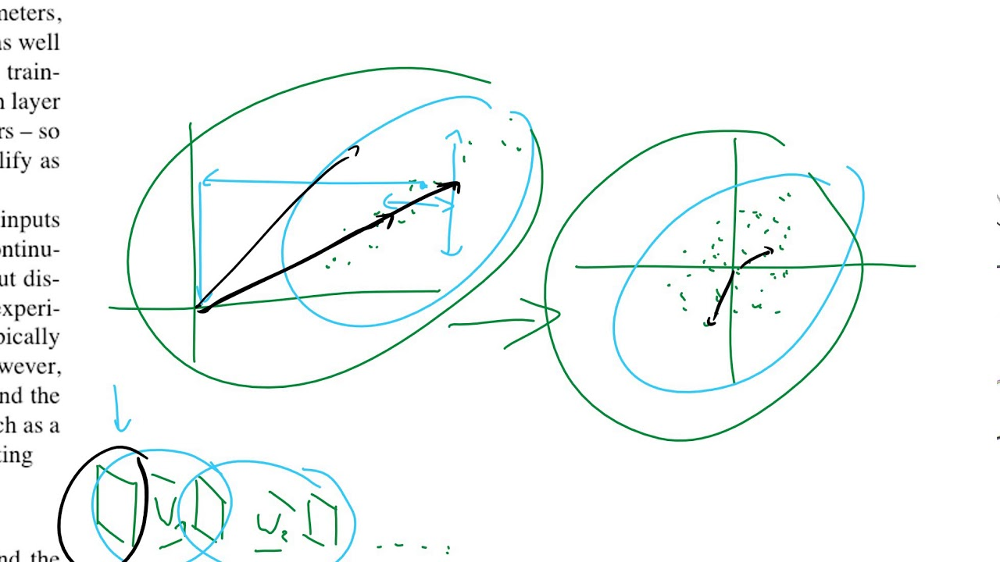

Давайте добавим в LeNet BN.

In [15]:
# Create LeNet Class
class BN_LeNet(nn.Module):
    def __init__(self, image_size):
        # Initialize the super class
        super(BN_LeNet, self).__init__()
        
        # Define model weights
        # We use Convolution + MaxPooling for each layer
        self.conv_1 = nn.Conv2d(3, 20, 5, padding=2)  # input channels: 3, output channels: 20, kernel size: 5
                                                      # padding = (kernel size - 1) / 2
        self.bn_1 = nn.BatchNorm2d(20)                # Batch Normalization
        self.mp_1 = nn.MaxPool2d(2)                   # MaxPooling 2X2
        
        self.conv_2 = nn.Conv2d(20, 50, 3, padding=1) # input channels: 20, output channels: 50, kernel size: 3
        self.bn_2 = nn.BatchNorm2d(50)                # Batch Normalization
        self.mp_2 = nn.MaxPool2d(2)
        
        self.conv_3 = nn.Conv2d(50, 100, 3, padding=1) # input channels: 50, output channels: 100, kernel size: 3
        self.bn_3 = nn.BatchNorm2d(100)                # Batch Normalization
        self.mp_3 = nn.MaxPool2d(2)
        
        self.dense_1 = nn.Linear(16*100, 500)          # Fully-connected layer, 500 outputs
                                                       # input features = (32/2**(num MaxPool layers))*(num previous output channels)
        self.bn_4 = nn.BatchNorm1d(500)                # Batch Normalization
        self.dense_2 = nn.Linear(500, 10)
        
    def forward(self, x):
        # layer 1
        h = self.conv_1(x)           
        h = self.bn_1(h)
        h = torch.relu(h)            
        h = self.mp_1(h)    
        # layer 2
        h = self.conv_2(h)
        h = self.bn_2(h)
        h = torch.relu(h)
        h = self.mp_2(h)
        # layer 3
        h = self.conv_3(h)
        h = self.bn_3(h)
        h = torch.relu(h)
        h = self.mp_3(h)
        # flatten
        h = h.view(x.shape[0], -1)   
        #hidden
        h = self.dense_1(h)        
        h = self.bn_4(h)
        h = torch.relu(h)         
        logits = self.dense_2(h)
        return logits

# Обучение модели

Epoch 16: trining loss=0.3449799950942397; test loss=0.4627312309294939
Learninig rate: 1.0000000000000002e-07
Iteration took 19.557694911956787s.


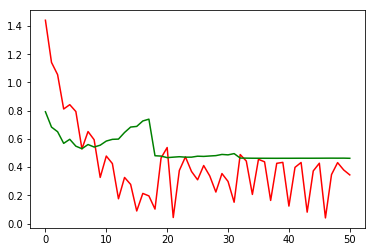

Early stop at 51000
Wall time: 17min 20s


In [13]:
%%time
model = BN_LeNet(32)
if is_cuda:
    model.to("cuda:0")

train(model, train_path, test_path, 50, 16, "bn_lenet.torch", lr_start=1e-3)

## Тестируем модель

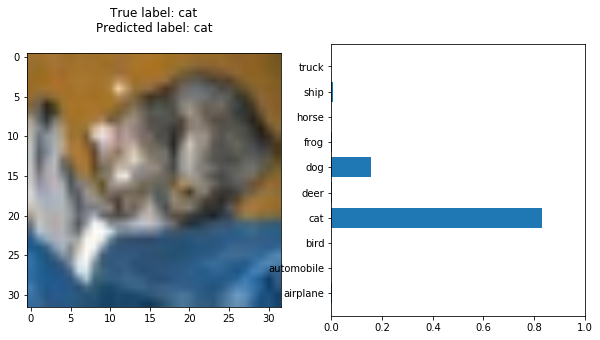

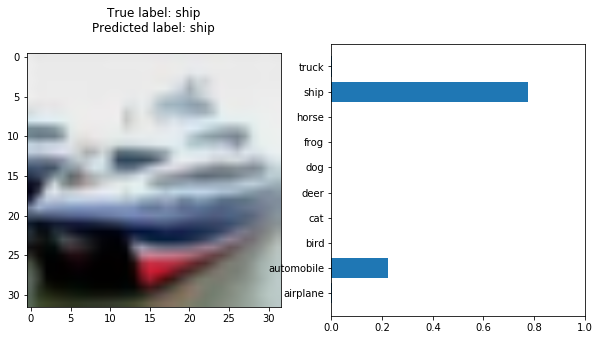

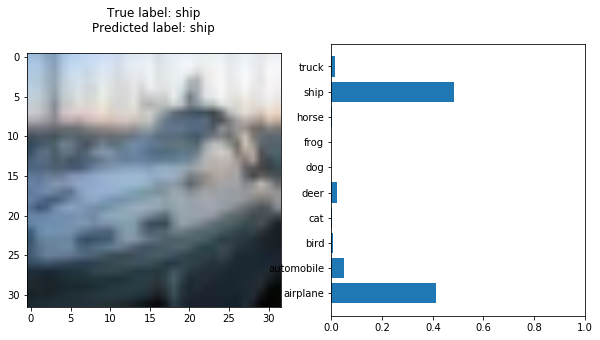

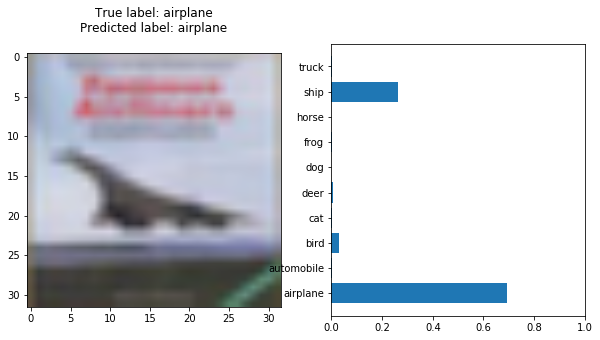

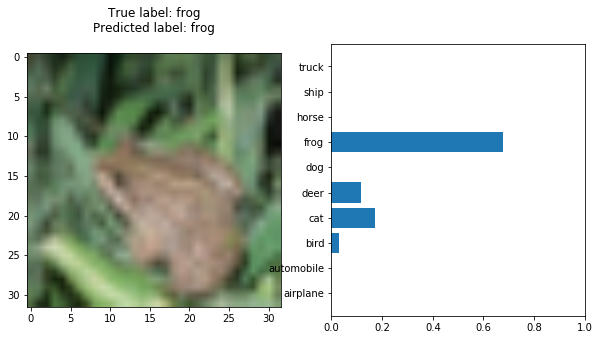

...

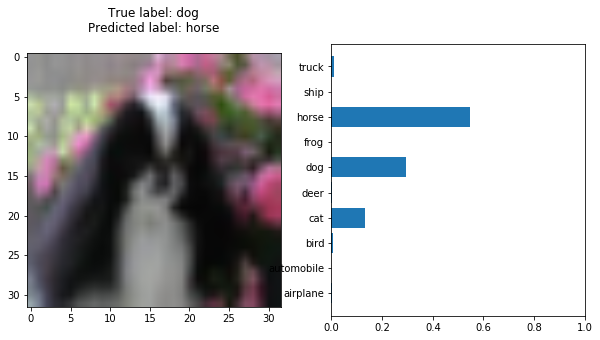

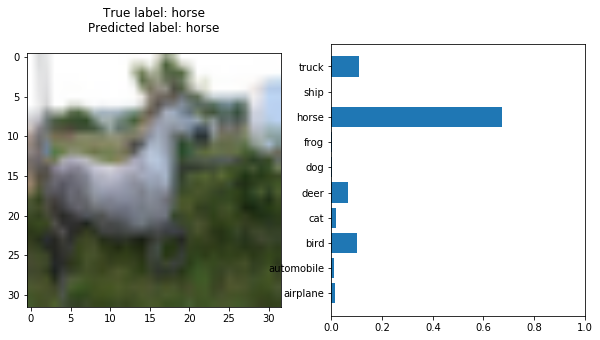

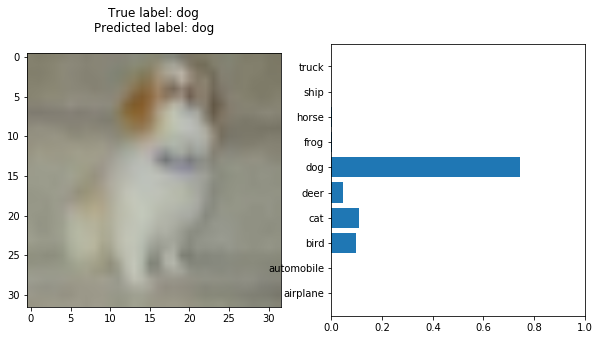

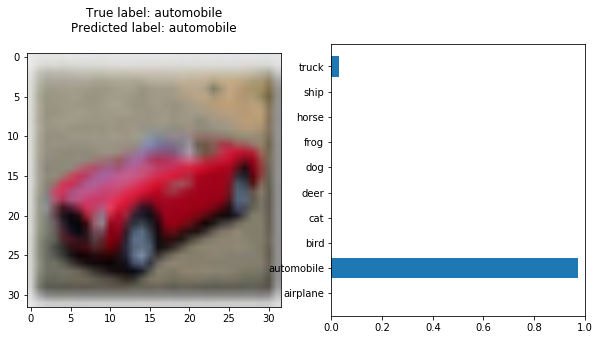

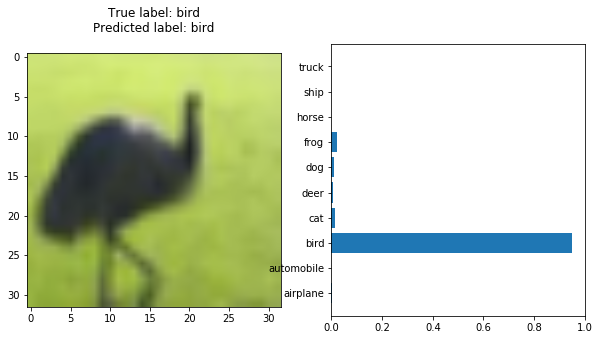

In [16]:
model = torch.load("bn_lenet.torch")

model.eval()
test_model(model)

Top-1 Accuracy: 0.7775


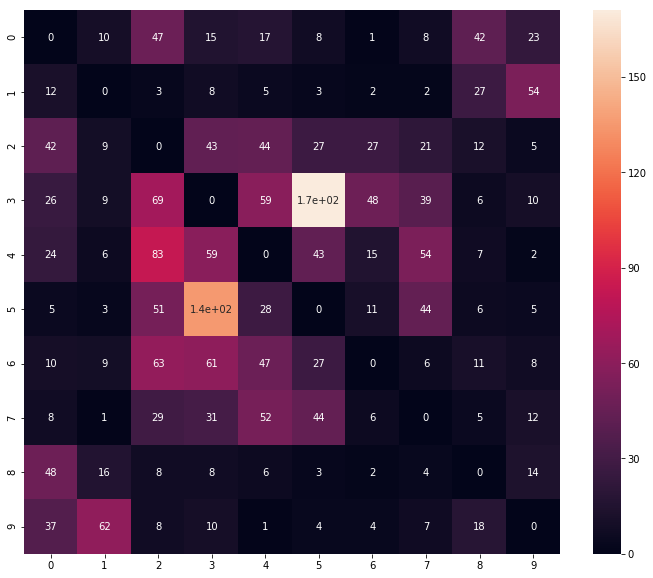

In [17]:
plot_errors(model)

# Отрисуем архитектуру модели


(dot.exe:6064): Pango-WARNING **: couldn't load font "Times Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


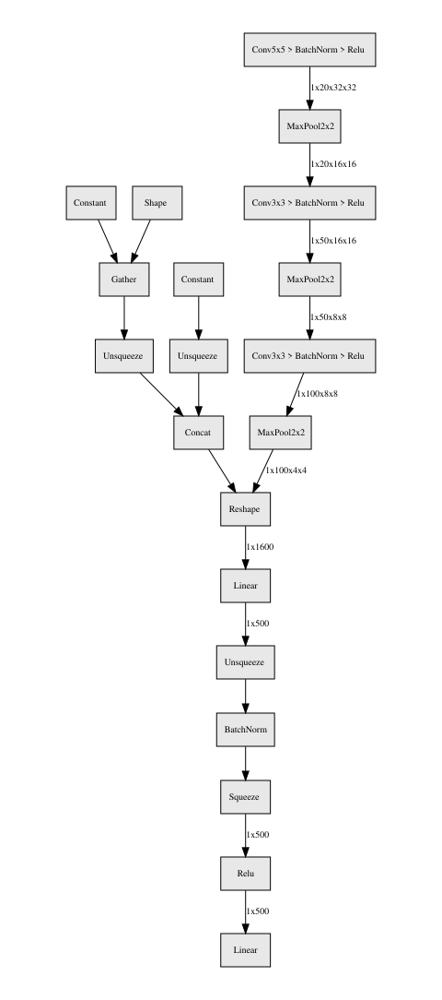

In [18]:
plot_architecture(model)

Batch-normalization дает очень хороший прирост к качеству, поэтому во всех дальнейших моделях будем использовать ее сразу. Кроме того, все следующие модели будут состоять из некоторых элементарных блоков. Эти блоки будут описываться в виде отдельного модуля, который будет в дальнейшем использован в основной сети.

# Network In Network

В обычной сверточной сети на каждом сверточном слое извлекаются довольно низкоуровневые признаки из исходной картинки. На первых слоях это могут быть какие-то линии, углы, точки или еще какие-то простые структуры. На каждом следующем слое сеть извлекает все более сложные признаки, состоящие из каких-то комбинаций различных признаков предыдущего слоя. Но что нам мешает на изображении извлекать сразу сложные признаки? Это позволило бы сократить количество весов в модели и сделало бы ее более мощной. Однако при этом мы упираемся в ограничения свертки. Дело в том, что сама операция свертки является линейной. И даже некоторая нелинейность не очень может помочь справиться с этой проблемой.

Но ведь нейросети такие мощные, с их помощью можно представить любую функцию с заданной точностью! Так почему бы с их помощью не добавить нелинейность к результатам применения свертки? Заодно их можно обучить, и получить такую нелинейность, которая лучше всего будет решать поставленную задачу. В этом и заключается подход, используемый в блоках Network In Network. Вместо обычной свертки к изображению применяется маленькая сверточная нейросеть, которая позволяет извлекать сложные пространственные признаки из исходного изображения. Ниже приведен рисунок одного из таких блоков в сравнении с обычной сверткой.

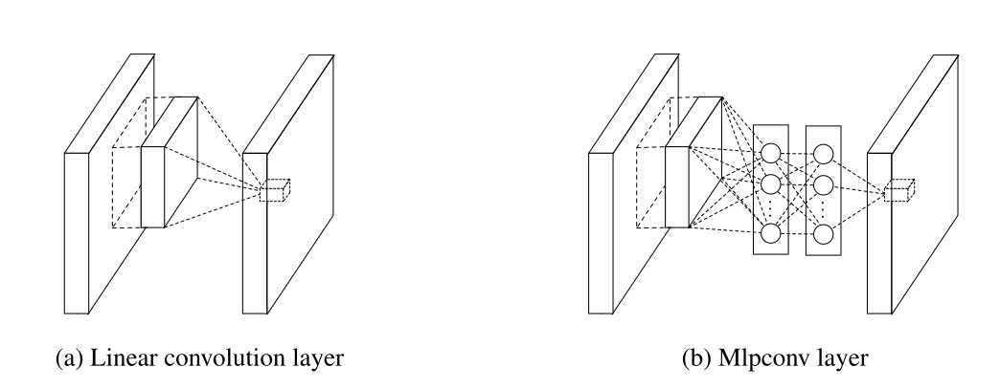

Осталось понять, как такую прелесть реализовать, чтобы каждый раз не приходилось делать после свертки flatten, а потом результат ресайзить обратно в картинку. Для этого используется простое, но гениальное решение -- свертка размером 1x1. Действительно, такая свертка пройдет по всем признакам, полученным после линейной свертки и применит к ним необходимое преобразование, а на выходе получится картинка исходного размера.

<a href="https://arxiv.org/pdf/1312.4400.pdf">Ссылка на статью</a>

Ниже представлен вид сети Network in Netwotk. Она состоит из последовательных MLPConv-блоков (не знаю, при чем тут пони). Мы немного изменим сеть: вместо блока GlobalAveragePooling добавим Flatten + FullyConnected, как это было сделано в сетях, которые писали выше. Таким образом, мы сможем использовать старую архитектуру сети с новыми блоками.

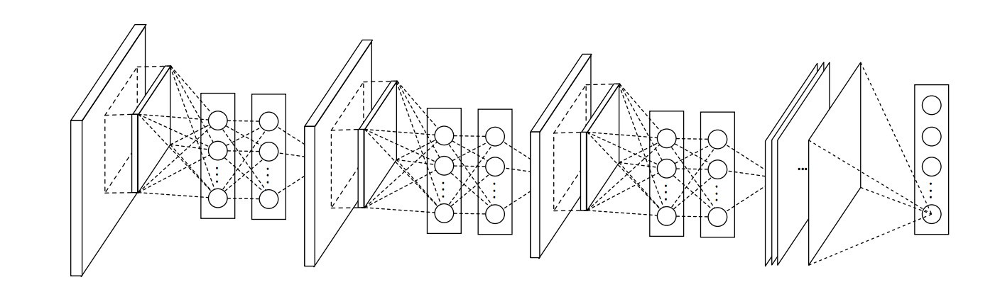

In [19]:
class MLPConv(nn.Module):

    def __init__(self, inputs, num_conv, num_h1, num_h2):
        super(MLPConv, self).__init__()
        
        self.conv_1 = nn.Conv2d(inputs, num_conv, 3, padding=1)
        self.bn_1 = nn.BatchNorm2d(num_conv)
        self.conv_2 = nn.Conv2d(num_conv, num_h1, 1)
        self.bn_2 = nn.BatchNorm2d(num_h1)
        self.conv_3 = nn.Conv2d(num_h1, num_h2, 1)
        self.bn_3 = nn.BatchNorm2d(num_h2)
        
    def forward(self, x):
        h = torch.relu(self.bn_1(self.conv_1(x)))
        h = torch.relu(self.bn_2(self.conv_2(h)))
        return self.bn_3(self.conv_3(h))

In [20]:
class NIN(nn.Module):
    def __init__(self):
        super(NIN, self).__init__()
        
        self.conv_1 = MLPConv(3, 10, 20, 20)
        self.mp_1 = nn.MaxPool2d(2)
        
        self.conv_2 = MLPConv(20, 30, 50, 50)
        self.mp_2 = nn.MaxPool2d(2)
        
        self.conv_3 = MLPConv(50, 70, 100, 100)
        self.mp_3 = nn.MaxPool2d(2)
        
        self.dense_1 = nn.Linear(16*100, 500)
        self.bn = nn.BatchNorm1d(500)
        self.dense_2 = nn.Linear(500, 10)
        
    def forward(self, x):
        # layer 1
        h = self.conv_1(x)
        h = torch.relu(h)
        h = self.mp_1(h)
        # layer 2
        h = self.conv_2(h)
        h = torch.relu(h)
        h = self.mp_2(h)
        # layer 3
        h = self.conv_3(h)
        h = torch.relu(h)
        h = self.mp_3(h)
        # flatten
        h = h.view(x.shape[0], -1)
        #hidden
        h = self.dense_1(h)
        h = self.bn(h)
        h = torch.relu(h)
        # output
        logits = self.dense_2(h)
        return logits

Epoch 22: trining loss=0.4175064474195242; test loss=0.4790086294859648
Learninig rate: 1.0000000000000002e-07
Iteration took 35.3135404586792s.


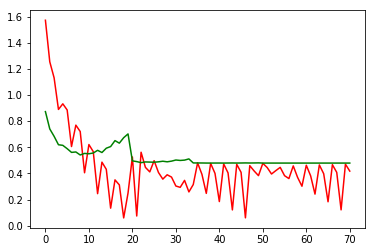

Early stop at 71000
Wall time: 42min 39s


In [18]:
%%time
model = NIN()
if is_cuda:
    model.to("cuda:0")

train(model, train_path, test_path, 50, 16, "bn_nin.torch", lr_start=1e-3)

## Тестируем модель

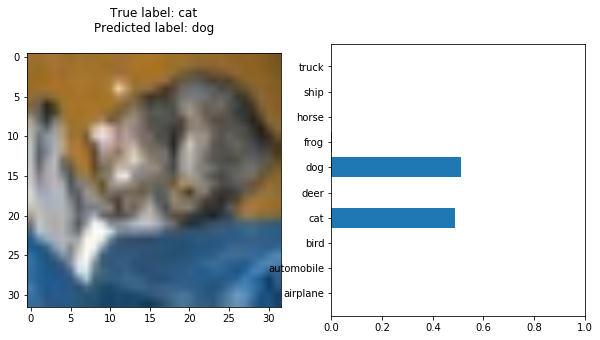

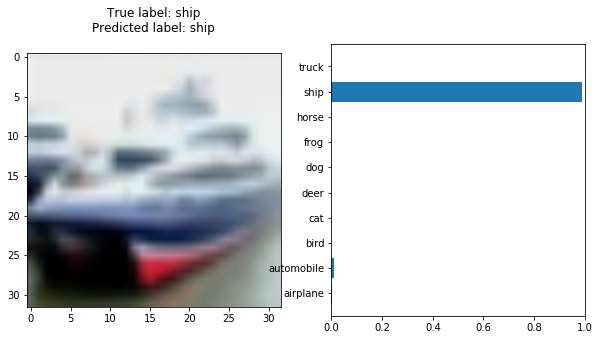

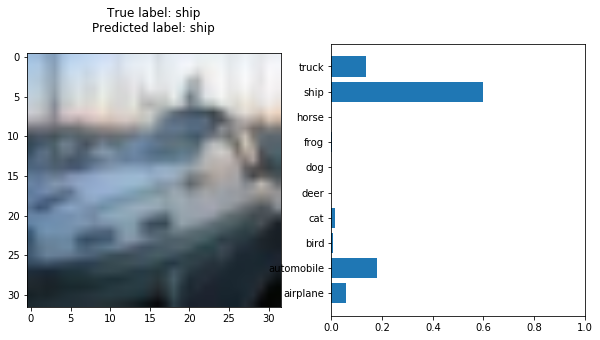

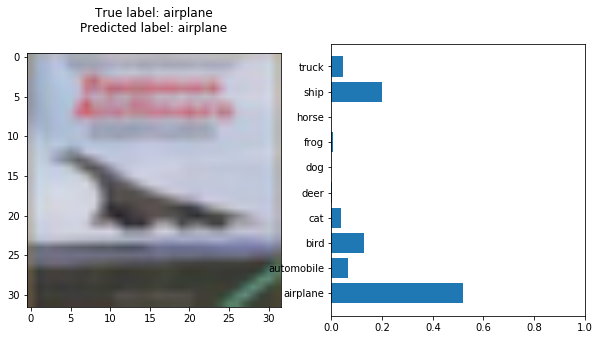

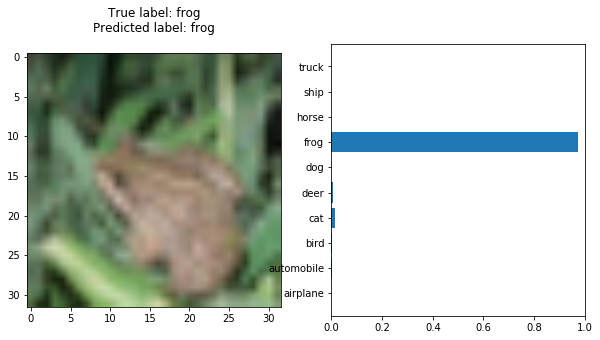

...

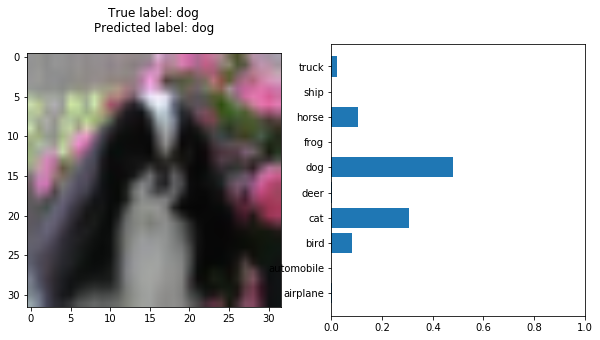

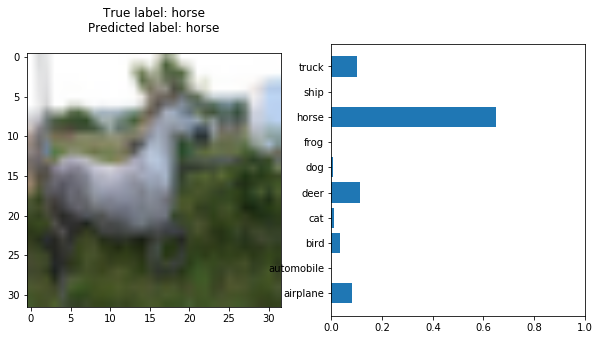

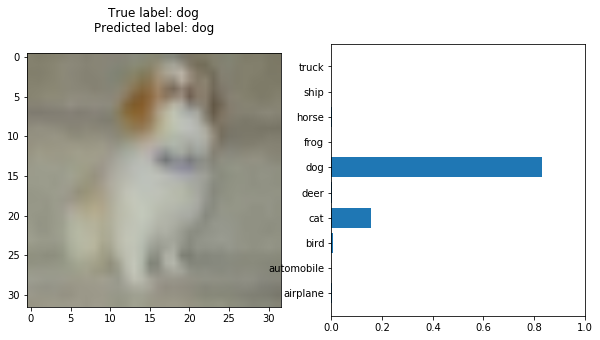

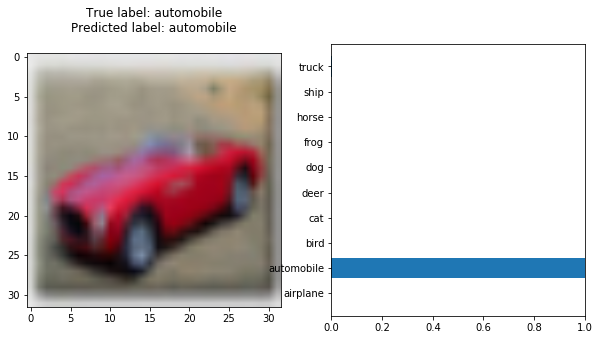

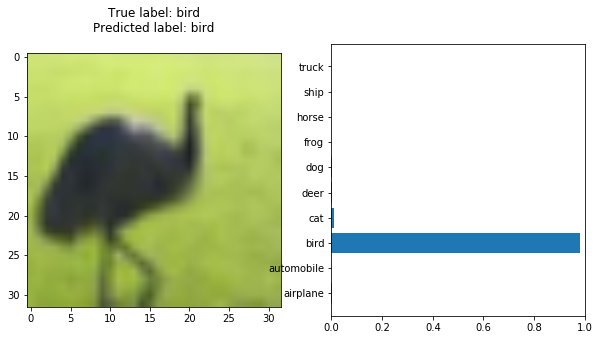

In [21]:
model = torch.load("bn_nin.torch")

model.eval()
test_model(model)

Top-1 Accuracy: 0.7667


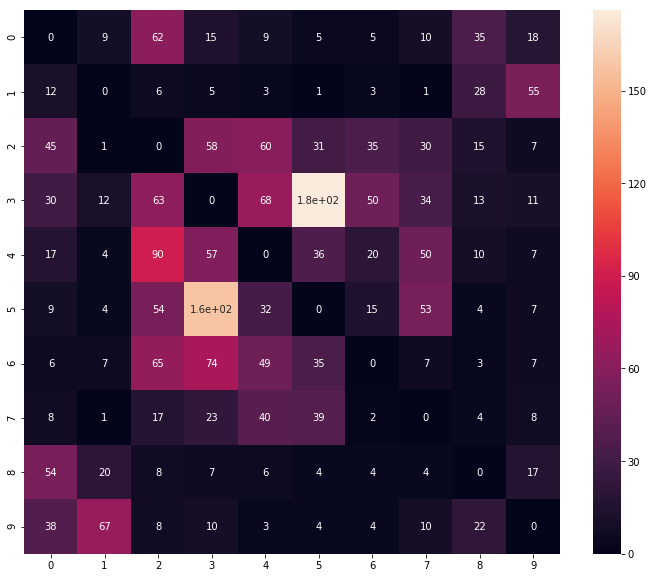

In [22]:
plot_errors(model)

# Отрисуем архитектуру модели


(dot.exe:3816): Pango-WARNING **: couldn't load font "Times Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


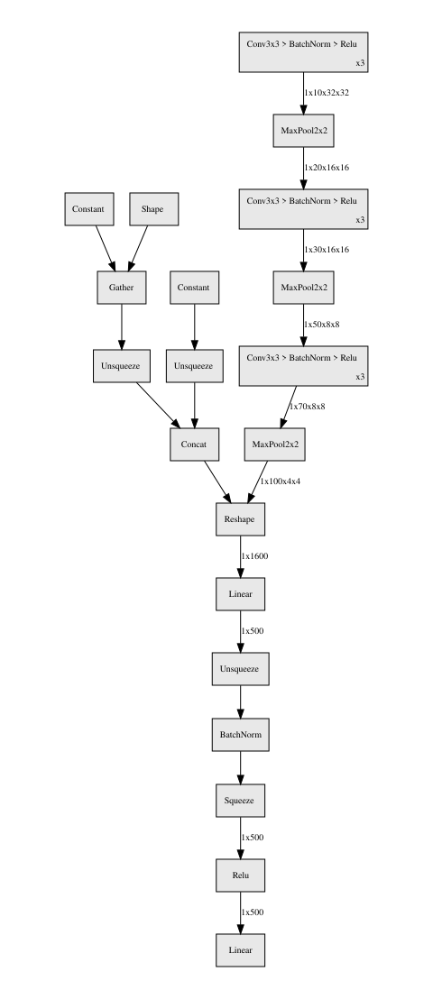

In [24]:
plot_architecture(model)

# Inception (GoogLeNet)

Продолжим исправлять недостатки предыдущих архитектур. Очевидно, что свертки разных размеров позволили бы извлекать признаки разных масштабов. Чем больше размер свертки, тем более сложные признаки она может найти на исходном изображении. Поэтому в некоторых нейросетях вначале используют свертки большего размера, чтобы извлечь сложные признаки, а затем, после операции пуллинга, когда изображение становится меньше, используют свертки меньшего размера.

При этом признаки меньших масштабов также важны для классификации. Они извлекают границы изображения, информацию о сочетаниях цветов и другое, что пропускают более сложные свертки. Но как одновременно учитывать признаки разных масштабов? Можно просто взять свертки разного размера и применить их к изображению. Полученные после сверток картинки можно рассматривать как каналы одной общей картинки и сконкатенировать их друг с другом. Таким образом, один блок сети будет выглядеть следующим образом.

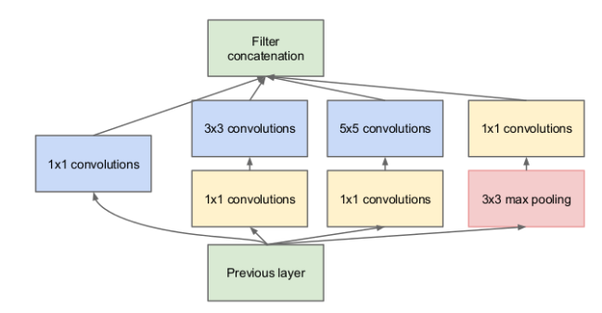


Из таких блоков можно составить нейросеть. Такая архитектура уже является довольно сложной, поэтому обучить ее сразу вряд ли получится. Для обучения такой сети через каждые 3 Inception-блока делаются дополнительные выходы. При этом одновременно обучается только 3 блока сети, а веса предыдущих блоков замораживаются. И только после полного обучения всех блоков размораживаются старые веса и происходит дообучение сети. 

<a href="https://arxiv.org/pdf/1512.00567.pdf">Ссылка на статью (правда, про более позднюю архитектуру)</a>

Рассмотрим, как выглядит GoogLeNet и реализуем что-то похожее на первый из его блоков.

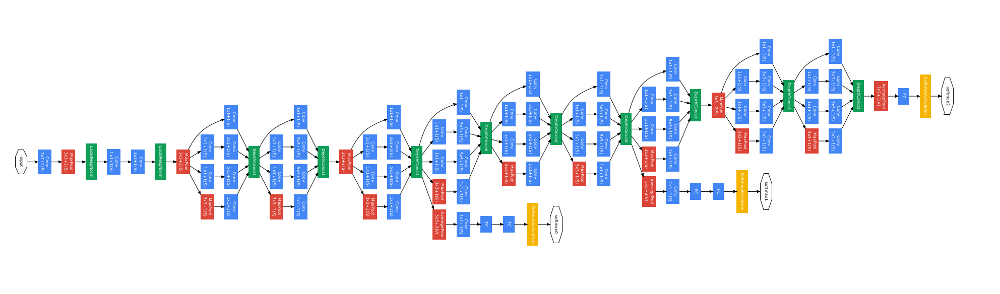

In [25]:
class Inception(nn.Module):
    
    def __init__(self, input_chanel, output_chanel):
        super(Inception, self).__init__()
        
        self.c1 = nn.Conv2d(input_chanel, output_chanel, 1)
        self.bn_1 = nn.BatchNorm2d(output_chanel)
        
        self.c21 = nn.Conv2d(input_chanel, output_chanel, 1)
        self.bn_21 = nn.BatchNorm2d(output_chanel)
        self.c22 = nn.Conv2d(output_chanel, output_chanel, 3, padding=1)
        self.bn_22 = nn.BatchNorm2d(output_chanel)
        
        self.c31 = nn.Conv2d(input_chanel, output_chanel, 1)
        self.bn_31 = nn.BatchNorm2d(output_chanel)
        self.c32 = nn.Conv2d(output_chanel, output_chanel, 5, padding=2)
        self.bn_32 = nn.BatchNorm2d(output_chanel)
        
        self.m41 = nn.MaxPool2d(3,1,padding=1)
        self.c42 = nn.Conv2d(input_chanel, output_chanel, 1)
        self.bn_42 = nn.BatchNorm2d(output_chanel)
        
    def forward(self, x):
        h1 = torch.relu(self.bn_1(self.c1(x)))
        
        h2 = torch.relu(self.bn_21(self.c21(x)))
        h2 = torch.relu(self.bn_22(self.c22(h2)))
        
        h3 = torch.relu(self.bn_31(self.c31(x)))
        h3 = torch.relu(self.bn_32(self.c32(h3)))
        
        h4 = self.m41(x)
        h4 = torch.relu(self.bn_42(self.c42(h4)))
        
        h = torch.cat((h1,h2,h3,h4),1)

        return h

In [26]:
class InceptionV1(nn.Module):
    
    def __init__(self):
        super(InceptionV1, self).__init__()
        
        self.c1 = Inception(3, 4)
        self.c2 = Inception(16, 8)
        self.c3 = Inception(32, 16)
        
        self.m1 = nn.MaxPool2d(2)
        self.m2 = nn.MaxPool2d(2)
        self.m3 = nn.MaxPool2d(2)
        
        self.l1 = nn.Linear(1024,500)
        self.bn = nn.BatchNorm1d(500)
        self.l2 = nn.Linear(500,10)
        
    def forward(self, x):
        h = torch.relu(self.c1(x))
        h = self.m1(h)
        h = torch.relu(self.c2(h))
        h = self.m2(h)
        h = torch.relu(self.c3(h))
        h = self.m3(h)
        h = h.view(h.shape[0], -1)
        h = torch.relu(self.bn(self.l1(h)))
        h = self.l2(h)
        return h

Epoch 15: trining loss=0.4346257988139987; test loss=0.5456211601048708
Learninig rate: 1.0000000000000002e-07
Iteration took 67.78520369529724s.


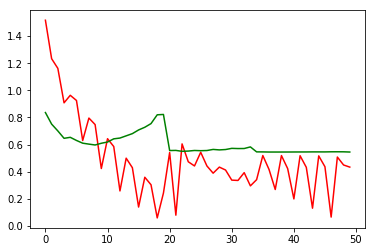

Early stop at 50000
Wall time: 54min 46s


In [23]:
%%time
model = InceptionV1()
if is_cuda:
    model.to("cuda:0")

train(model, train_path, test_path, 50, 16, "bn_inception.torch", lr_start=1e-3)

## Тестируем модель

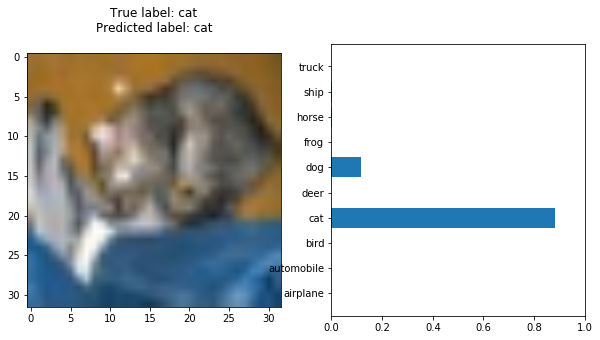

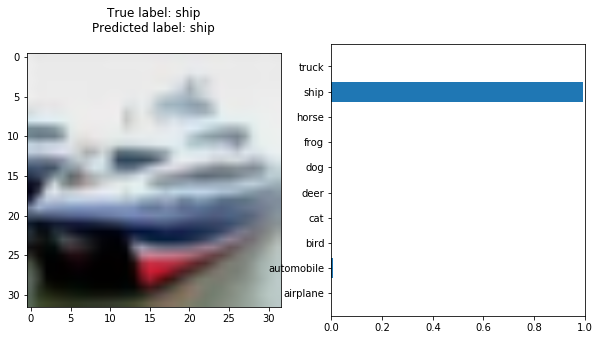

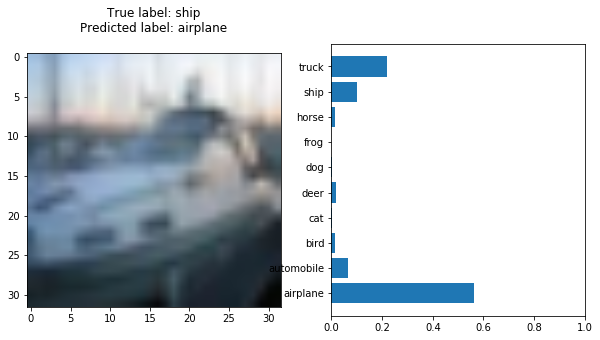

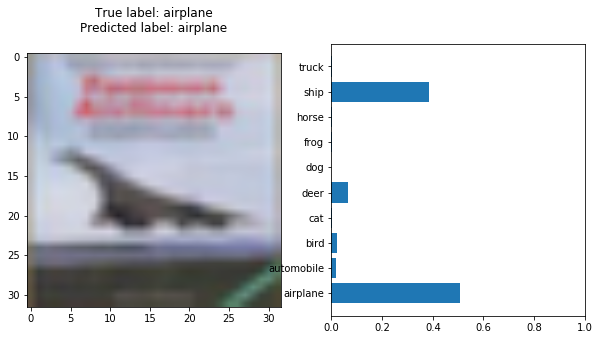

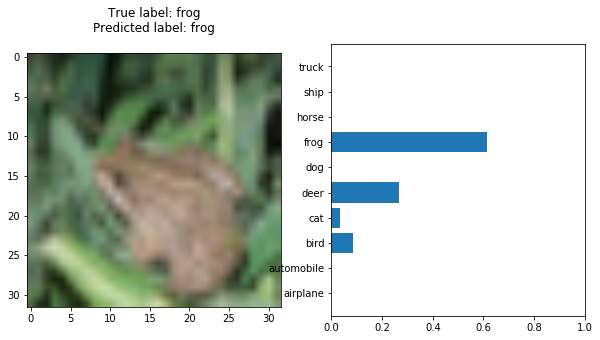

...

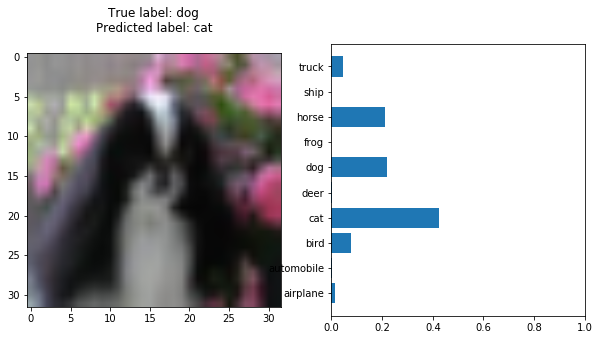

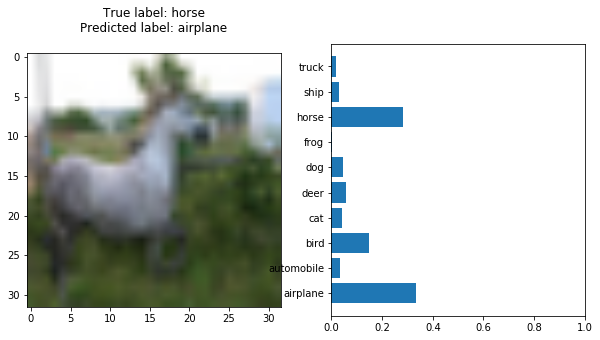

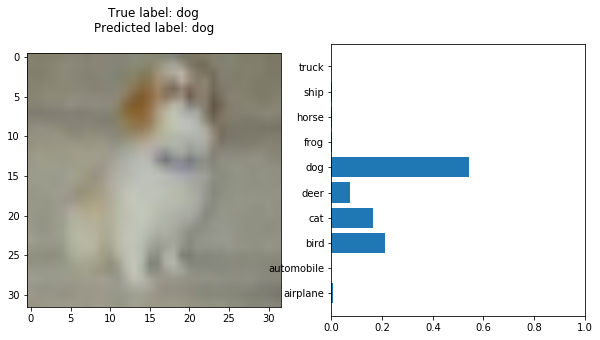

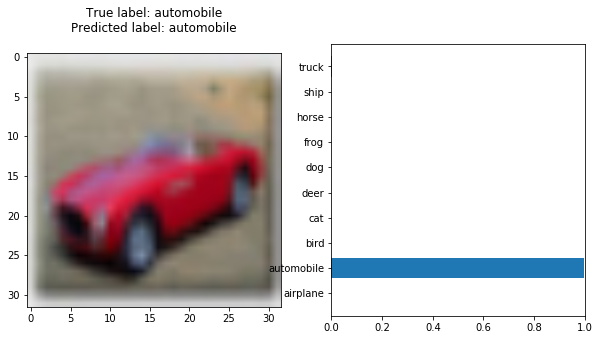

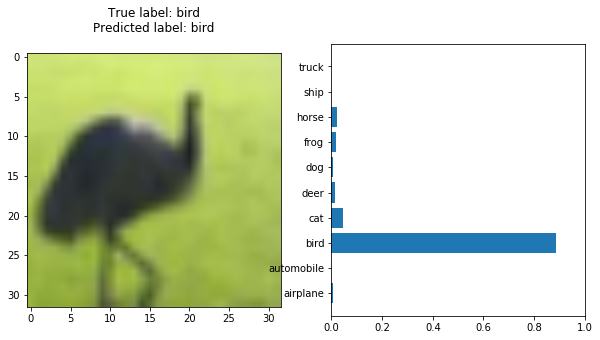

In [27]:
model = torch.load("bn_inception.torch")

model.eval()
test_model(model)

Top-1 Accuracy: 0.7327


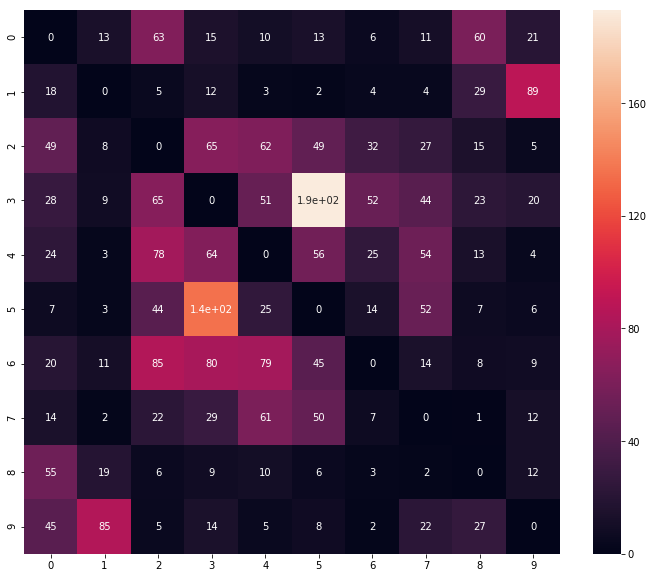

In [28]:
plot_errors(model)

# Отрисуем архитектуру модели


(dot.exe:12372): Pango-WARNING **: couldn't load font "Times Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


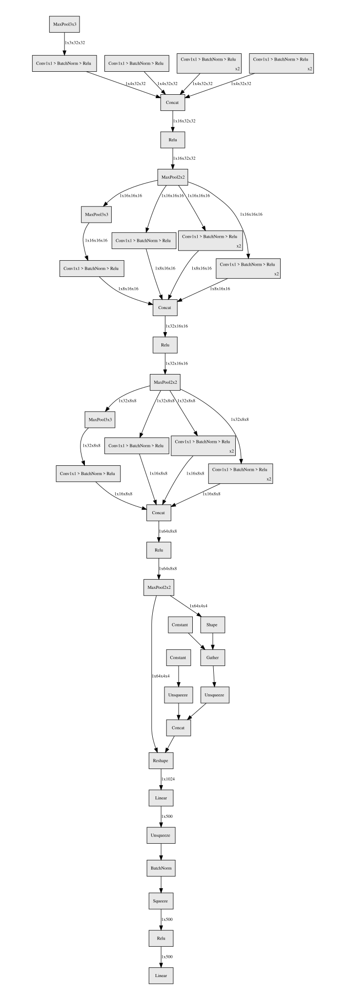

In [30]:
plot_architecture(model)

# Residual Neural Networks (ResNet)

Нейросети развивались, и в какой-то момент произошло непоправимое. Появились реально ГЛУБОКИЕ сети. Нет, диплернинг диплернингом называли и раньше, но на практике глубина сетей редко достигала даже 20 слоев, а работали такие сети плохо и не долго. И все из-за vanishing gradient problem. Чем глубже была сеть, тем меньше была магнитуда градиента, которая доходила от последнего слоя до начального. При этом функция активации ReLU, которая и была призвана бороться с проблемой, полностью решить проблему не могла, ведь для отрицательных весов градиенты просто терялись. И в этот момент кому-то могло показаться, что диплернинг достиг предела и уперся в глубину сетей... Но нифига подобного!

Всех спасла очень простая идея. Пусть есть некоторая функция $f(*)$, градиент в которой затухает. Обычная нейросеть представима в виде функции $f(...f(f(f(x)))...)$. Назовем выход с некоторого слоя нейросети $a$, а, соответственно, выход со следующего слоя будет $f(a)$. Тогда, чтобы оптимизировать веса на этом слое (и всех предшествующих), необходимо посчитать $\nabla_af(a)$. Здесь и кроется проблема, ведь градиент затухает. Но давайте изменим сам слой. Пусть теперь функция, которую мы вычисляем на каждом слое будет $f^*(a)=f(a)+a$. Тогда градиент $\nabla_af^*(a)=1+\nabla_af(a)$. То есть он не затухает! Осталось эту идею воплотить в виде сети. Ну, формула есть, дальше не сложно. Один блок сети будет выглядеть  как на картинке ниже.

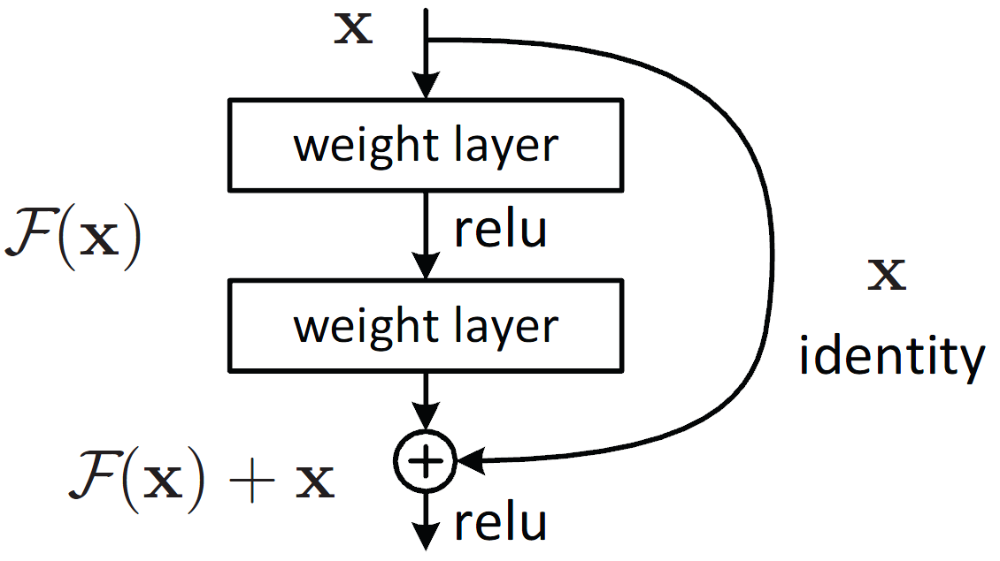

К приятным бонусам можно отнести то, что если вдруг в каком-нибудь из блоков веса окажутся нулевыми... Сеть все равно будет работать! А мы, потирая лапки скажем: "круто, у нас сеть еще и сама свою длину регулирует!"

Как обычно, <a href="https://arxiv.org/pdf/1512.03385.pdf">ссылка на статью</a>.

Раз градиент не затухает, из таких блоков можно строить сеть любой глубины. Как-то так.

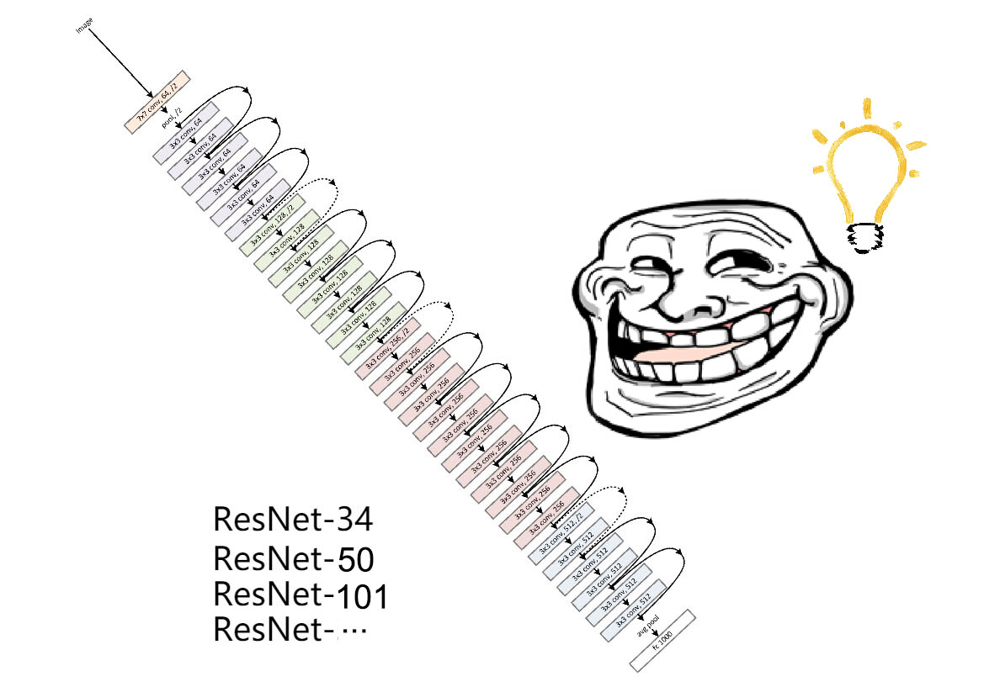




In [31]:
class Residual(nn.Module):
    def __init__(self, inner):
        super(Residual, self).__init__()
        
        self.inner = inner
        
    def forward(self, x):
        h = self.inner(x)
        return h + x

In [32]:
class ResNetBlock(nn.Module):
    def __init__(self, num_inputs):
        super(ResNetBlock, self).__init__()
        
        self.conv_1 = nn.Conv2d(num_inputs, num_inputs, 3, padding=1)
        self.bn = nn.BatchNorm2d(num_inputs)
        
        self.conv_2 = nn.Conv2d(num_inputs, num_inputs, 3, padding=1)
        
    def forward(self, x):
        h = torch.relu(self.bn(self.conv_1(x)))
        return self.conv_2(h)
        

In [33]:
class ResNet(nn.Module):
    def __init__(self, num_residual):
        super(ResNet, self).__init__()
        
        self.conv_1 = nn.Conv2d(3, 20, 7, padding=3)
        self.bn_1 = nn.BatchNorm2d(20)
        # define list of residual blocks
        self.res_block_1 = [(Residual(ResNetBlock(20)), nn.BatchNorm2d(20)) for i in range(num_residual)]
        # PyTorch does not support lists of modules, 
        # so every module should be manually added to network parameters.
        for i, (conv, bn) in enumerate(self.res_block_1):
            self.add_module("res_conv_1_" + str(i), conv)
            self.add_module("res_bn_1_" + str(i), bn)
        self.mp_1 = nn.MaxPool2d(2)
        
        self.conv_2 = nn.Conv2d(20, 35, 3, padding=1)
        self.bn_2 = nn.BatchNorm2d(35)
        self.res_block_2 = [(Residual(ResNetBlock(35)), nn.BatchNorm2d(35)) for i in range(num_residual)]
        for i, (conv, bn) in enumerate(self.res_block_2):
            self.add_module("res_conv_2_" + str(i), conv)
            self.add_module("res_bn_2_" + str(i), bn)
        self.mp_2 = nn.MaxPool2d(2)
        
        self.conv_3 = nn.Conv2d(35, 50, 3, padding=1)
        self.bn_3 = nn.BatchNorm2d(50)
        self.res_block_3 = [(Residual(ResNetBlock(50)), nn.BatchNorm2d(50)) for i in range(num_residual)]
        for i, (conv, bn) in enumerate(self.res_block_3):
            self.add_module("res_conv_3_" + str(i), conv)
            self.add_module("res_bn_3_" + str(i), bn)
        self.mp_3 = nn.MaxPool2d(2)
        
        self.l1 = nn.Linear(16*50,500)
        self.bn = nn.BatchNorm1d(500)
        self.l2 = nn.Linear(500,10)
        
    def forward(self, x):
        h = self.bn_1(self.conv_1(x))
        h = torch.relu(h)
        for (conv, bn) in self.res_block_1:
            h = torch.relu(bn(conv(h)))
        h = self.mp_1(h)
        
        h = self.bn_2(self.conv_2(h))
        h = torch.relu(h)
        for (conv, bn) in self.res_block_2:
            h = torch.relu(bn(conv(h)))
        h = self.mp_2(h)
        
        h = self.bn_3(self.conv_3(h))
        h = torch.relu(h)
        for (conv, bn) in self.res_block_3:
            h = torch.relu(bn(conv(h)))
        h = self.mp_3(h)
        # flatten
        h = h.view(x.shape[0], -1)
        #hidden
        h = self.l1(h)
        h = self.bn(h)
        h = torch.relu(h)
        # output
        logits = self.l2(h)
        return logits
        

Epoch 16: trining loss=0.2975118143558502; test loss=0.4250620291531086
Learninig rate: 1.0000000000000002e-07
Iteration took 116.04115200042725s.


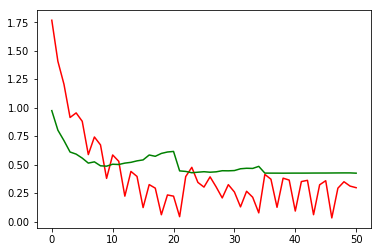

Early stop at 51000
Wall time: 1h 42min 26s


In [29]:
%%time
model = ResNet(4)
if is_cuda:
    model.to("cuda:0")

train(model, train_path, test_path, 50, 16, "bn_resnet.torch", lr_start=1e-3)

## Тестируем модель

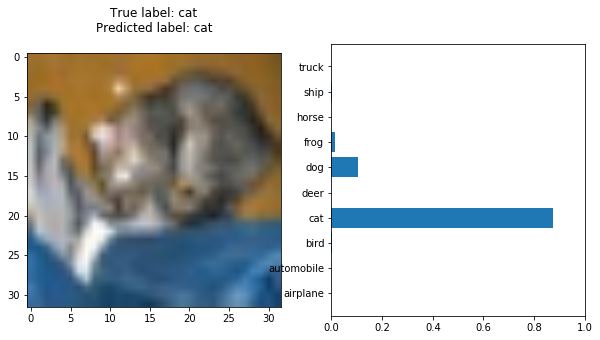

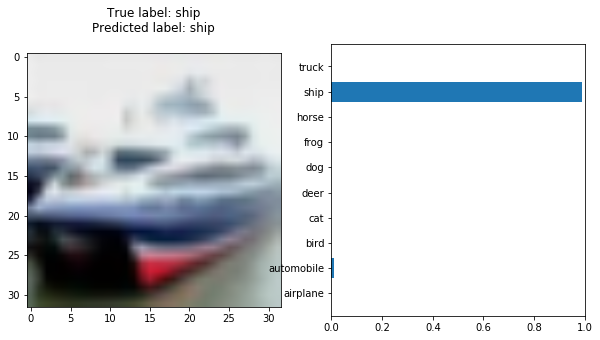

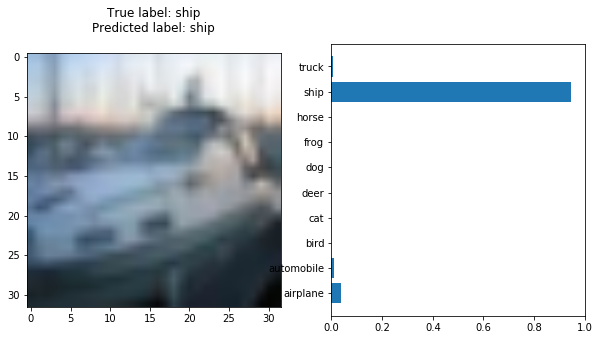

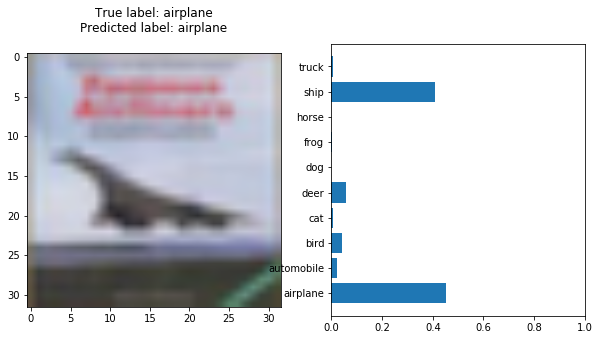

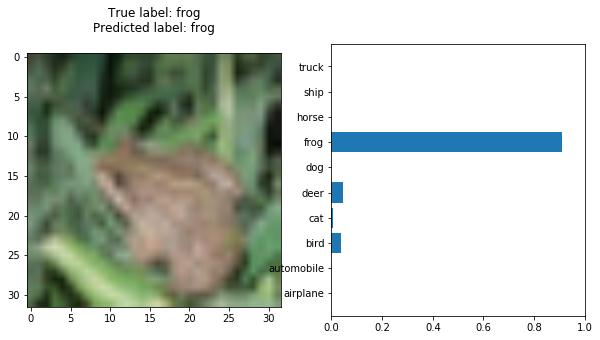

...

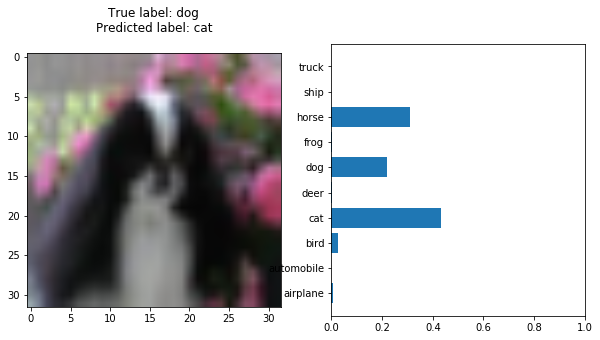

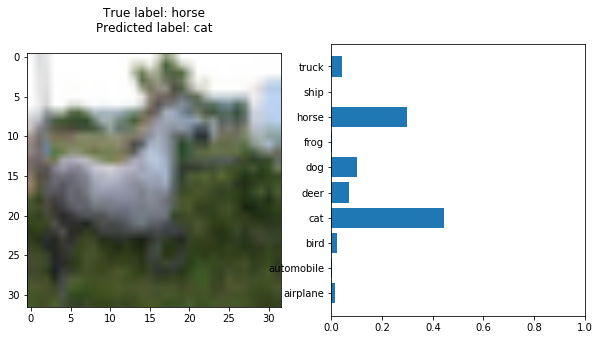

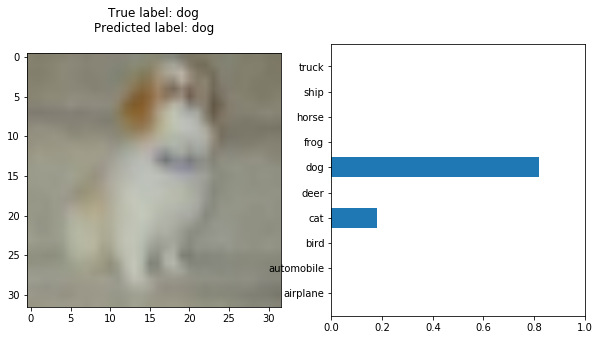

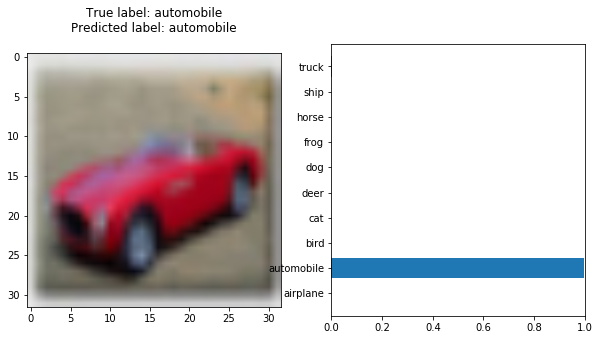

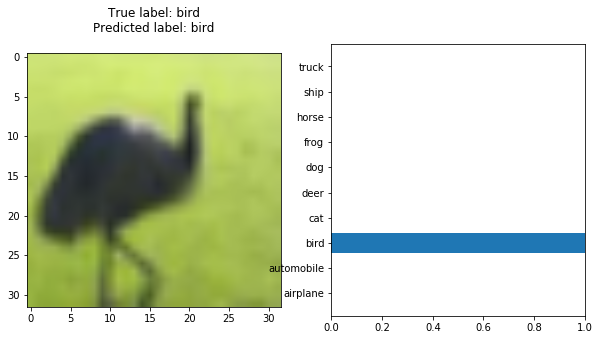

In [34]:
model = torch.load("bn_resnet.torch")

model.eval()
test_model(model)

Top-1 Accuracy: 0.803


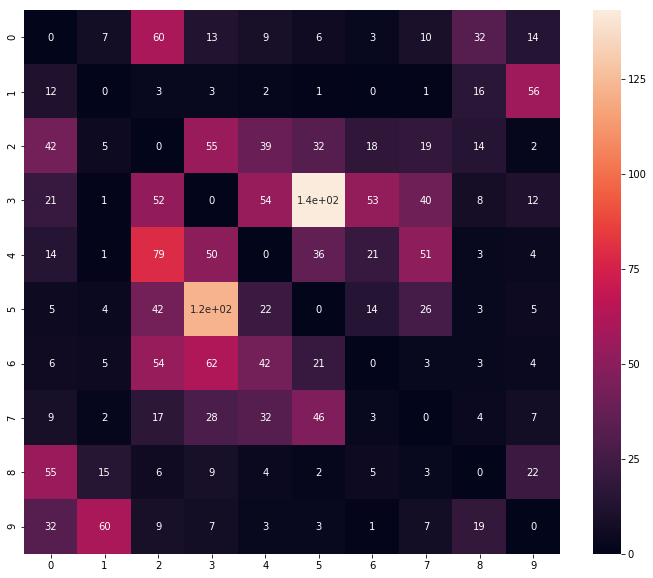

In [35]:
plot_errors(model)

# Отрисуем архитектуру модели


(dot.exe:13828): Pango-WARNING **: couldn't load font "Times Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


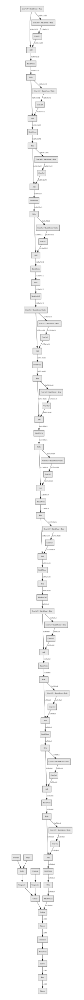

In [36]:
plot_architecture(model)

На этом можно было бы закончить говорить про архитектуру ResNet, но на самом деле это далеко не конец. Концепция, которая лежит в основе метода, универсальна и не зависит от архитектуры блока, к которому мы применяем. Поэтому на практике встречаются такие алгоритмы, как <a href="https://arxiv.org/pdf/1602.07261.pdf">InceptionResNet</a>, NINResNet, <a href="https://arxiv.org/pdf/1603.08029.pdf">RiR (ResNet in ResNet)</a> ну не знаю, потому что, <a href="https://arxiv.org/pdf/1611.05431.pdf">ResNeXt</a> чтобы довести идеи Inception и ResNet совсем до абсурда, <a href="https://arxiv.org/pdf/1902.06066.pdf">SE-ResNet, SE-ResNeXt</a>, <a href="https://arxiv.org/pdf/1807.08920.pdf">CMPE-SE-ResNet и CMPE-SE-WRN</a> потому что <a href="https://arxiv.org/pdf/1709.01507.pdf">SE-блок</a> придумали. И именно поэтому я решил реализовать Residual-блок в виде декоратора (а вовсе не потому, что он был в учебной программе и его хорошо бы повторить). Ведь теперь его можно навешивать почти куда угодно.

# DenseNet

Однако, о наиболее странном развитии идеи Residual Neural Networks я намеренно умолчал. Хотя, после всего, что я написал выше, идея кажется простой и понятной. Если мы можем прибавить к выходу некоторого слоя его вход, то почему бы нам не пробросить такие же связи через 2 слоя, то есть прибавить вход слоя к выходу следующего. Идея кажется хорошей, да и градиенты потекут гораздо лучше. Но в таком случае ничто не мешает пойти еще дальше и создать связи через 3 слоя. Ну а потом и через 4 можно... Однако на этом все таки стоит остановиться. По крайней мере, так решили авторы <a href="https://arxiv.org/pdf/1608.06993.pdf">статьи</a>. Таким образом, архитектура каждого Dense-блока проста и понятна: на вход каждой из 4 сверток и на выход подается сумма всего, что было раньше. Вот так это выглядит на картиночке. Стоит сказать, что внутри Dense-блока количество признаков не изменяется, поэтому в сети добавляются дополнительные свертки между блоками.

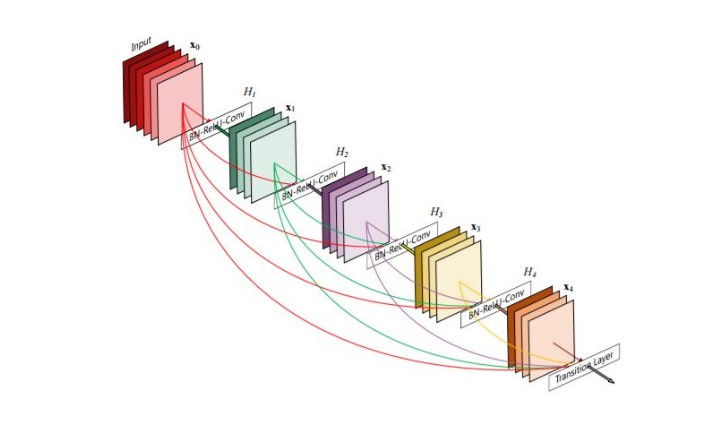

Осталось добавить свертки, извлекающие новые признаки и пуллинги -- и архитектура DenseNet готова. Ее вид показан на картинке ниже. Она не сложная в реализации, но дает весьма неплохое качество out-of-box.

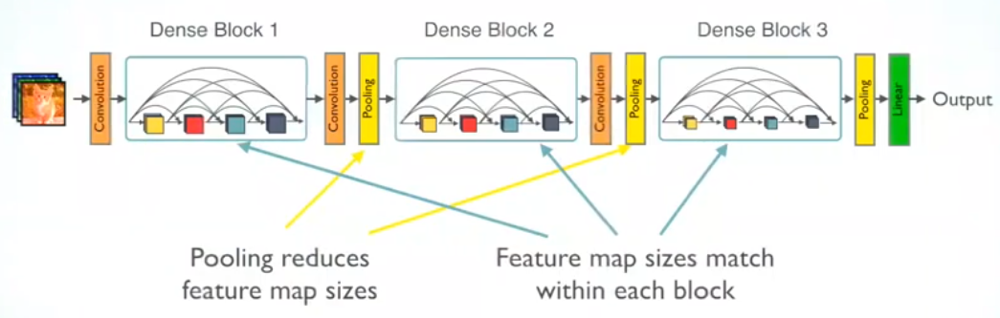


In [37]:
class DenseBlock(nn.Module):
    def __init__(self, num_conv):
        super(DenseBlock, self).__init__()
        
        self.conv_1 = nn.Conv2d(num_conv, num_conv, 3, padding=1)
        self.bn_1 = nn.BatchNorm2d(num_conv)
        self.conv_2 = nn.Conv2d(num_conv, num_conv, 3, padding=1)
        self.bn_2 = nn.BatchNorm2d(num_conv)
        self.conv_3 = nn.Conv2d(num_conv, num_conv, 3, padding=1)
        self.bn_3 = nn.BatchNorm2d(num_conv)
        self.conv_4 = nn.Conv2d(num_conv, num_conv, 3, padding=1)
        self.bn_4 = nn.BatchNorm2d(num_conv)
        
    def forward(self, x):
        h1 = torch.relu(self.bn_1(self.conv_1(x)))
        h2 = torch.relu(self.bn_2(self.conv_2(h1 + x)))
        h3 = torch.relu(self.bn_3(self.conv_3(x + h1 + h2)))
        h4 = torch.relu(self.bn_4(self.conv_4(x + h1 + h2 + h3)))
        return h4 + h3 + h2 + h1 + x

In [38]:
class DenseNet(nn.Module):
    def __init__(self):
        super(DenseNet, self).__init__()
        
        self.conv_1 = nn.Conv2d(3, 20, 3, padding=1)
        self.bn_1 = nn.BatchNorm2d(20)
        self.db_1 = DenseBlock(20)
        self.mp_1 = nn.MaxPool2d(2)
        
        self.conv_2 = nn.Conv2d(20, 50, 3, padding=1)
        self.bn_2 = nn.BatchNorm2d(50)
        self.db_2 = DenseBlock(50)
        self.mp_2 = nn.MaxPool2d(2)
        
        self.conv_3 = nn.Conv2d(50, 100, 3, padding=1)
        self.bn_3 = nn.BatchNorm2d(100)
        self.db_3 = DenseBlock(100)
        self.mp_3 = nn.MaxPool2d(2)
        
        self.dense_1 = nn.Linear(16*100, 500)
        self.bn = nn.BatchNorm1d(500)
        self.dense_2 = nn.Linear(500, 10)
        
    def forward(self, x):
        # layer 1
        h = self.conv_1(x)
        h = self.bn_1(h)
        h = torch.relu(h)
        h = self.db_1(h)
        h = self.mp_1(h)
        
        # layer 2
        h = self.bn_2(self.conv_2(h))
        h = torch.relu(h)
        h = self.db_2(h)
        h = self.mp_2(h)
        
        # layer 3
        h = self.bn_3(self.conv_3(h))
        h = torch.relu(h)
        h = self.db_3(h)
        h = self.mp_3(h)
        
        # flatten
        h = h.view(x.shape[0], -1)
        #hidden
        h = self.bn(self.dense_1(h))
        h = torch.relu(h)
        # output
        logits = self.dense_2(h)
        return logits

Epoch 16: trining loss=0.26544768857583406; test loss=0.3757350804954767
Learninig rate: 1.0000000000000002e-07
Iteration took 103.87900829315186s.


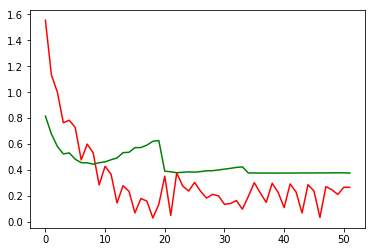

Early stop at 52000
Wall time: 1h 29min 22s


In [34]:
%%time
model = DenseNet()
if is_cuda:
    model.to("cuda:0")

train(model, train_path, test_path, 50, 16, "bn_densenet.torch", lr_start=1e-3)

## Тестируем модель

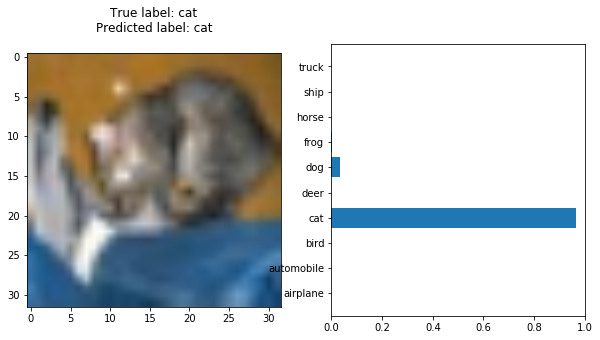

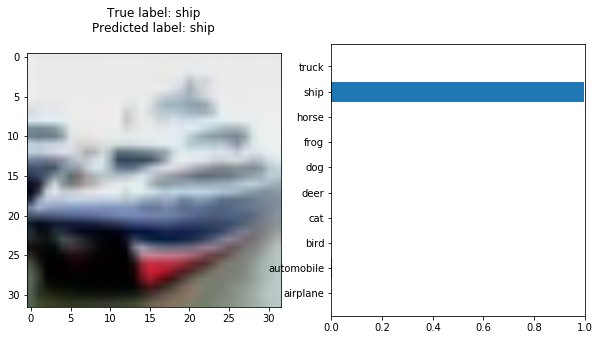

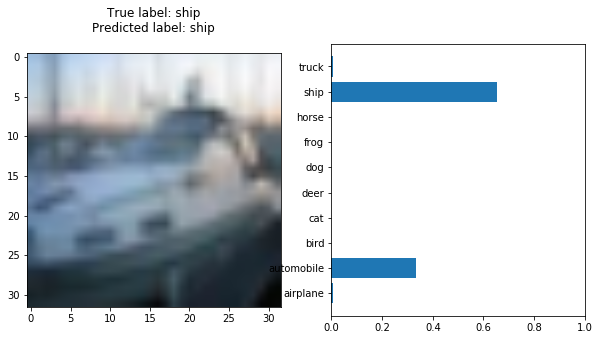

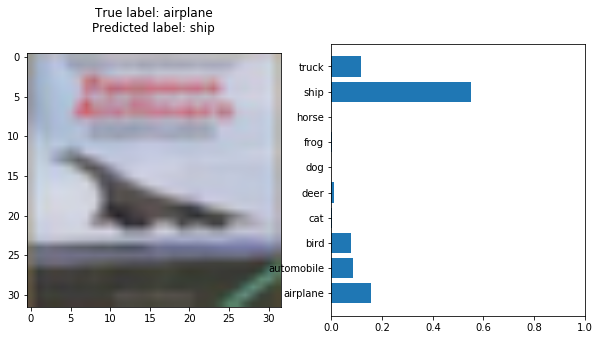

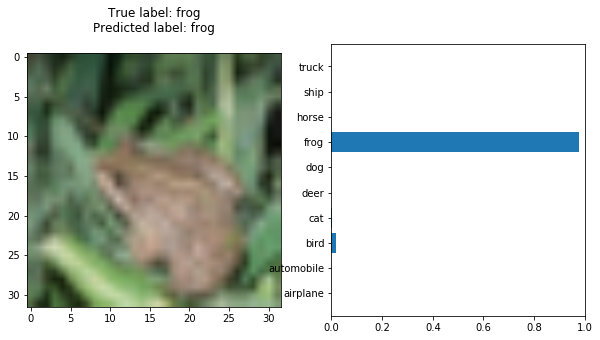

...

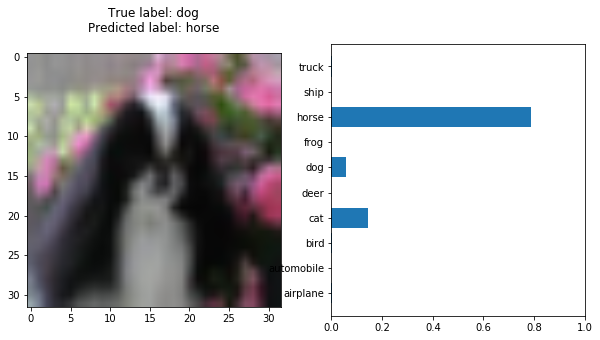

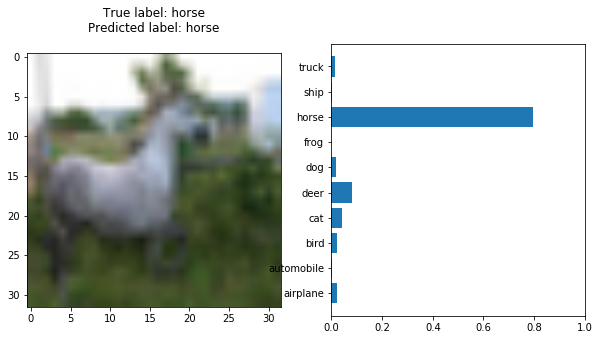

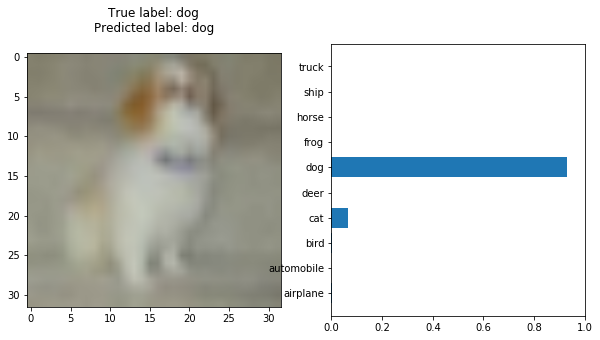

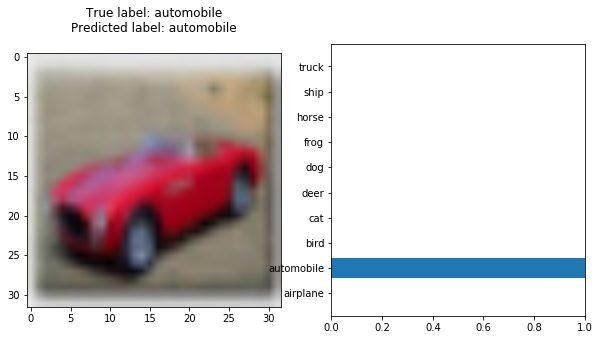

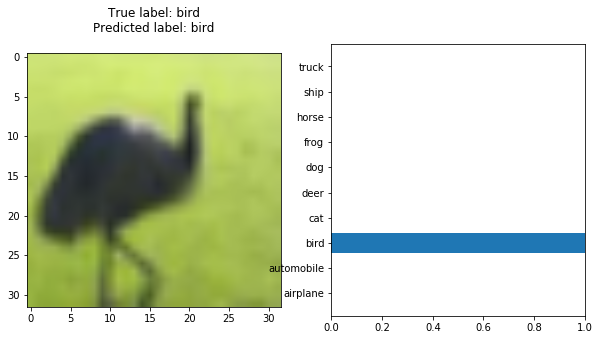

In [39]:
model = torch.load("bn_densenet.torch")

model.eval()
test_model(model)

Top-1 Accuracy: 0.8266


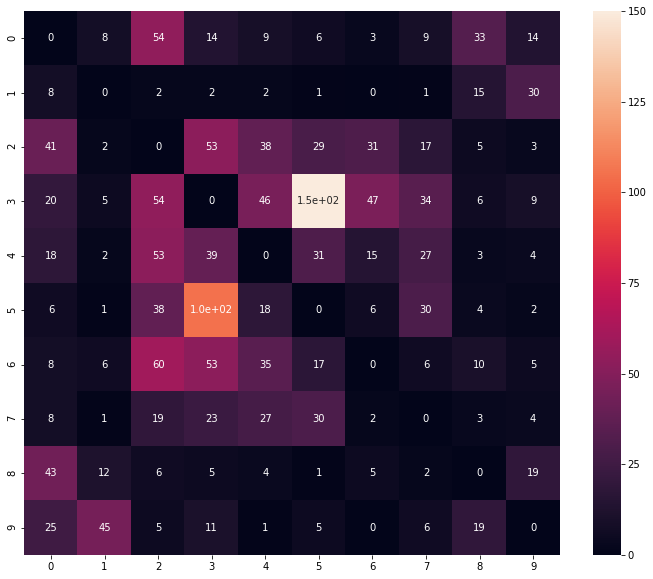

In [40]:
plot_errors(model)

# Отрисуем архитектуру модели


(dot.exe:6088): Pango-WARNING **: couldn't load font "Times Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


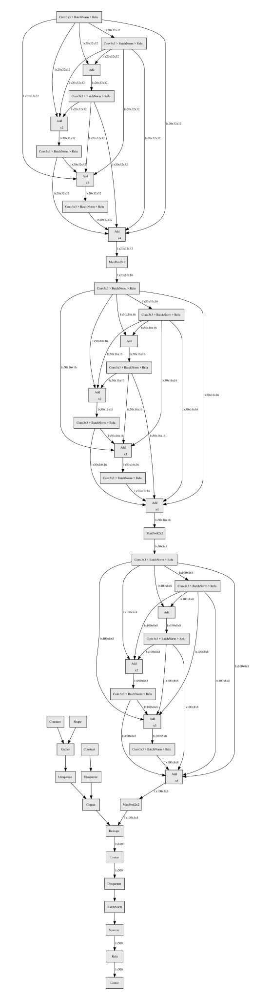

In [41]:
plot_architecture(model)

# Xception

Следующая модель развивает идею Inception блока. В стандартном Inception одновременно извлекаются признаки разных масштабов, которые в конце складываются в одну общую карту признаков. Граф вычислений в этот момент разветвляется, а в конце блока происходит конкатенация полученных карт признаков. Но почему бы в таком случае не увеличить количество параллельных веток? Конечно, это можно сделать, есть ли в этом смысл? Дело в том, что при помощи данной концепции можно существенно уменьшить количество весов в модели. Но для этого надо подробнее рассмотреть операцию свертки. Одна единственная свертка в модели позволяет извлекать пространственные признаки, уникальные для каждого канали изображения. Например свертка размером 3х3х3 (27 весов) позволит, определить, есть ли в некоторой точке горизонтальная граница по красному каналу, вертикальная по синему, а также определить присутствие центральной точки в зеленом канале. В финальный ответ при этом войдет какая-то взвешенная сумма этих признаков. Но давайте посмотрим на это с другой стороны. Мы же можем сначала из каждого из каналов извлечь соответствующие признаки просто разложив изображение по каналам и применив к каждому операцию свертки размером 3х3х1 (3 свертки по 9 весов, то есть 27), а затем совместить выходы и взять линейную комбинацию полученных признаков при помощи свертки 1х1х3 (еще 3 веса). Что-то похожее уже было описано в концепции Network In Network. В этом случае количество весов итоговой модели будет равно 30, то есть увеличится по сравнению с одной сверткой. Но что будет, если поменять свертки местами? То есть сначала взять линейную комбинацию каналов при помощи свертки 1х1х3 (3 веса), а затем из полученного изображения извлечь пространственные признаки при помощи... Одной свертки 3х3х1 (и еще 9). В силу линейности операции свертки, мы действительно можем так сделать. При этом количество весов модели составит 11 против 27 в исходной. Экономия весьма существенная. 

На этой идее и основан Depthwise Separable Convolution. Его архитектура изображена на рисунке ниже.

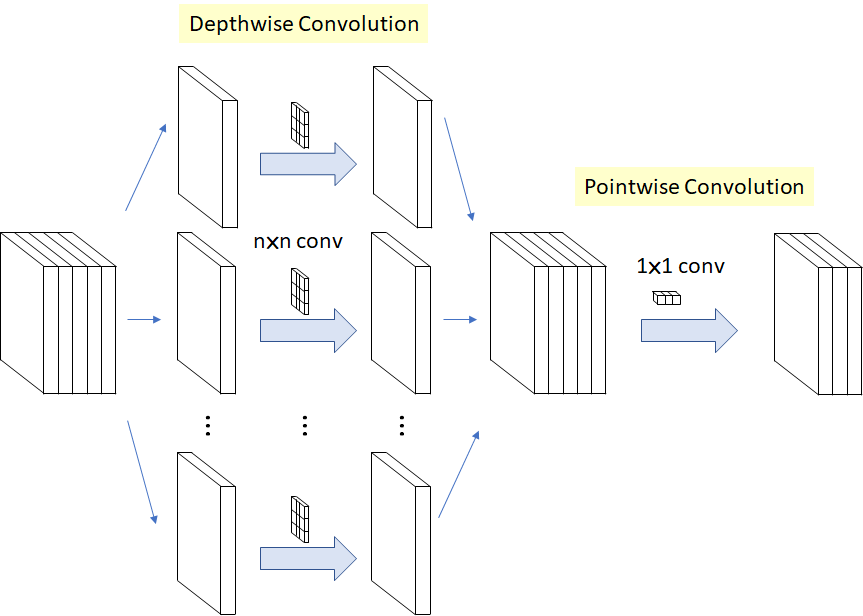

Однако, в случае модели Xception используется немного другая архитектура блока? названная "Extreme" Inception, в которой свертка 1x1 переехала в начало блока, как изображено на картинке ниже.

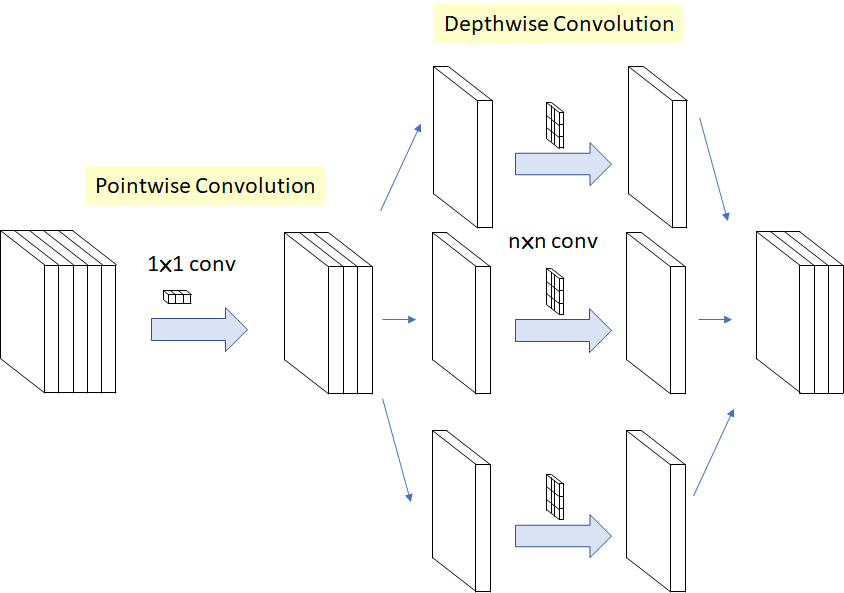


Вообще на реализацию всего, что описано в статье про Xception я не  претендую, желающие могут почитать <a href="https://arxiv.org/pdf/1610.02357.pdf">оригинальную статью</a>. Картинку с полной архитектурой я оставлю ниже. Здесь же из всей сети реализуем только Еntry flow, после которого сразу будет выход. В любом случае, этот материал не претендует на state-of-the-art производительность, а просто описывает различные подходы.

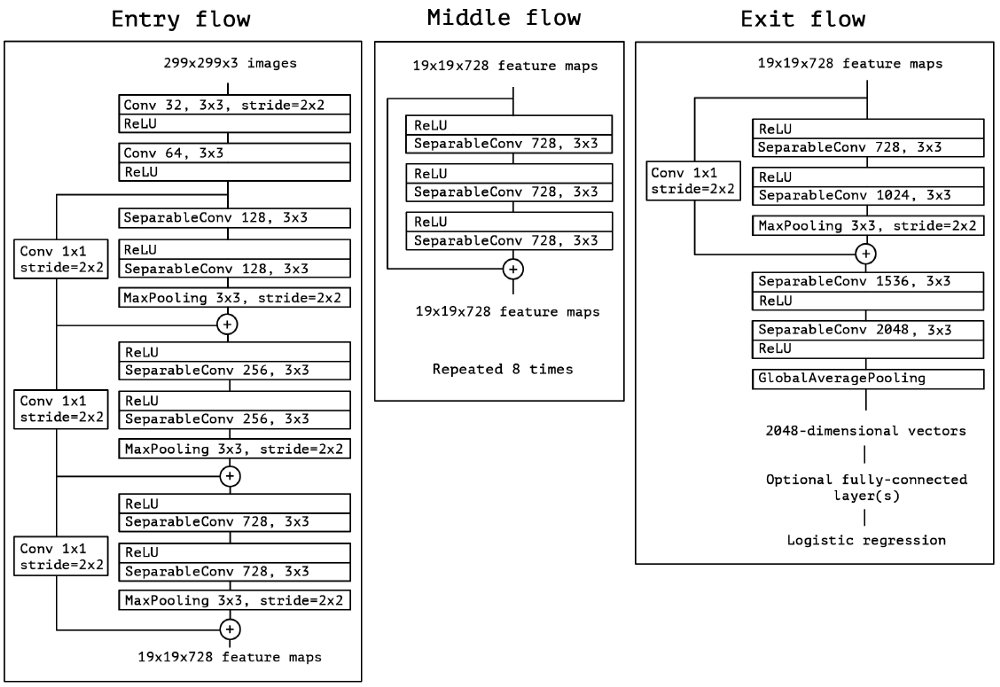

Однако, для реализации подобной концепции необходимо делить изображение по каналам на отдельные ветки, а потом собирать эти ветки в обратно в одно изображение. Это не слишком эффективно с точки зрения вычислений. Однако, это можно обойти. Для этого вернемся в 2012г. к архитектуре AlexNet. В ней использовалась идея, называемая Group Convolution. Согласно этой идеи, входные и выходные слои делились на несколько равных групп, к каждой из которых применялось свое преобразование, переводящее исходные признаки группы в итоговые. Если число групп будет равно числу входов (и выходов) сети, то в группе будет содержаться только один слой, то есть это будет именно то, чего мы и хотели.

In [42]:
class XConv(nn.Module):
    def __init__(self, input_size, output_size, kernel_size=3, padding=1):
        super(XConv, self).__init__()
        
        self.pointwise = nn.Conv2d(input_size, output_size, 1)
        
        # Specify group convolution with groups=num_channel
        self.depthwise = nn.Conv2d(output_size, output_size, kernel_size, padding=padding, groups=output_size)
        self.bn_2 = nn.BatchNorm2d(output_size)
        
    def forward(self, x):
        h = self.pointwise(x)
        h = self.bn_2(self.depthwise(h))
        return h

In [43]:
class Xception(nn.Module):
    def __init__(self):
        super(Xception, self).__init__()
        
        self.c1 = XConv(3, 10)
        self.c2 = XConv(10, 20)
        
        self.sc1 = nn.Conv2d(3, 20, 1, 2)
        
        self.c3 = XConv(20, 35)
        self.c4 = XConv(35, 50)
        
        self.sc2 = nn.Conv2d(20, 50, 1, 2)
        
        self.c5 = XConv(50, 75)
        self.c6 = XConv(75, 100)
        
        self.sc3 = nn.Conv2d(50, 100, 1, 2)

        self.c7 = XConv(100, 100)
        self.c8 = XConv(100, 100)
        
        self.m1 = nn.MaxPool2d(2)
        self.m2 = nn.MaxPool2d(2)
        self.m3 = nn.MaxPool2d(2)
        
        self.l1 = nn.Linear(16*100,500)
        self.bn = nn.BatchNorm1d(500)
        self.l2 = nn.Linear(500,10)
        
    def forward(self, x):
        h = torch.relu(self.c1(x))
        h = torch.relu(self.c2(h))
        h = self.m1(h)
        x = self.sc1(x)
        h = h+x
        h = torch.relu(self.c3(h))
        h = torch.relu(self.c4(h))
        h = self.m2(h)
        x = self.sc2(x)
        h = h+x
        h = torch.relu(self.c5(h))
        h = torch.relu(self.c6(h))
        h = self.m3(h)
        x = self.sc3(x)
        h = h+x
        h = torch.relu(self.c7(h))
        h = torch.relu(self.c8(h))
        h = h.view(h.shape[0], -1)
        h = torch.relu(self.bn(self.l1(h)))
        h = self.l2(h)
        return h

Epoch 21: trining loss=0.5038899268433452; test loss=0.5741697249412536
Learninig rate: 1.0000000000000002e-07
Iteration took 59.38722014427185s.


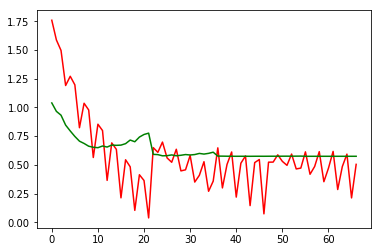

Early stop at 67000
Wall time: 1h 29s


In [20]:
%%time
model = Xception()
if is_cuda:
    model.to("cuda:0")

train(model, train_path, test_path, 50, 16, "bn_xception.torch", lr_start=1e-3)

## Тестируем модель

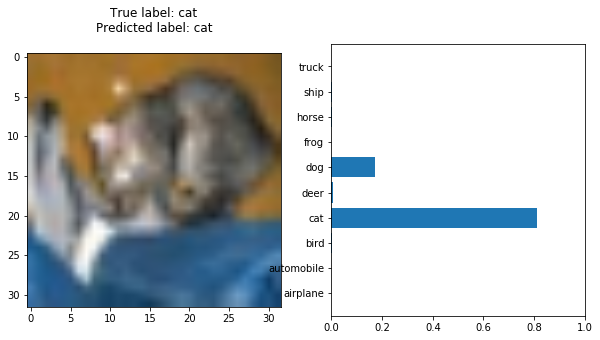

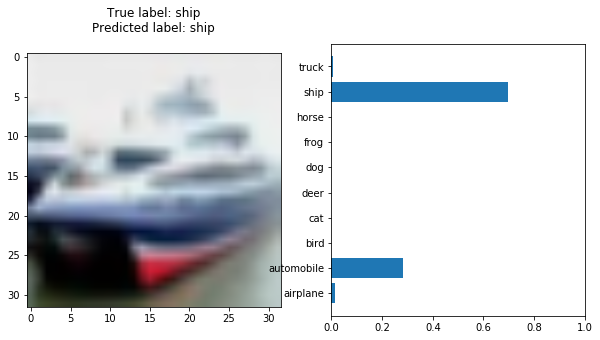

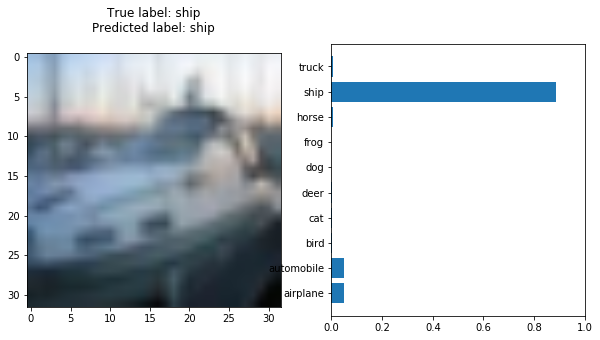

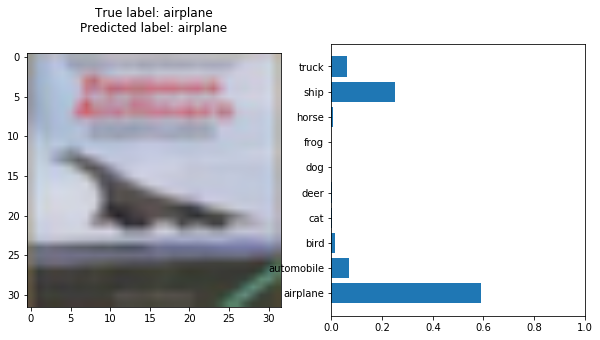

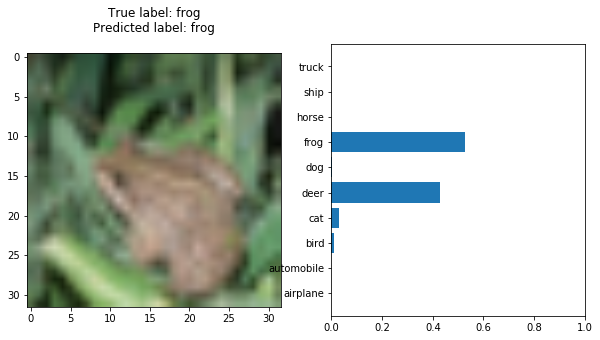

...

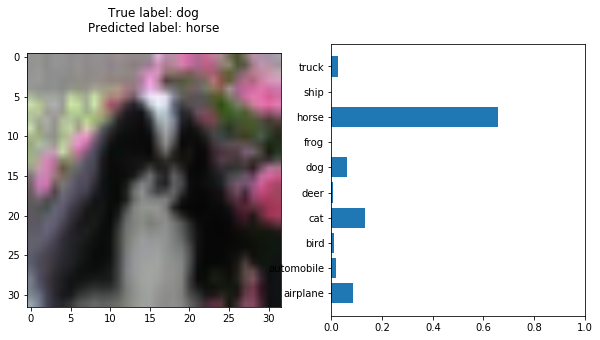

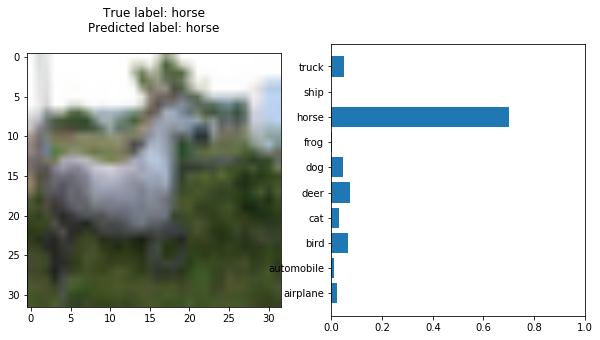

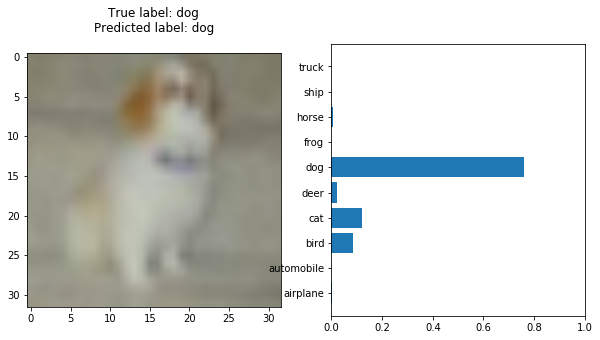

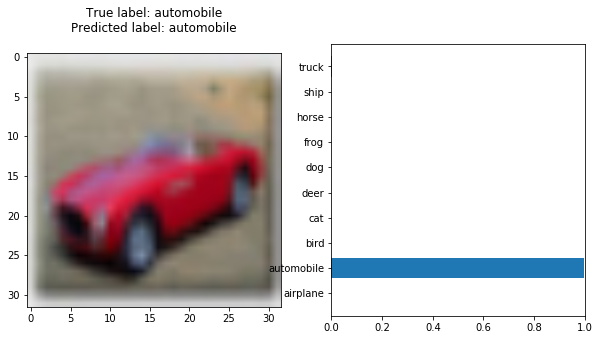

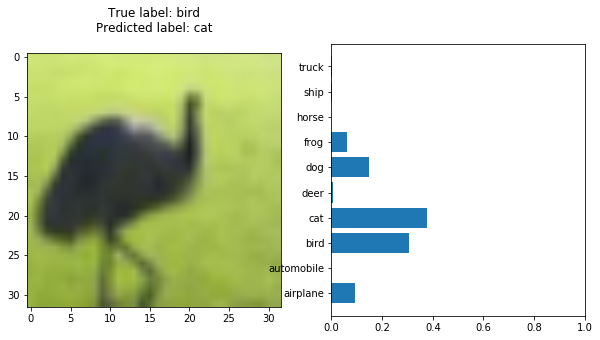

In [44]:
model = torch.load("bn_xception.torch")

model.eval()
test_model(model)

Top-1 Accuracy: 0.706


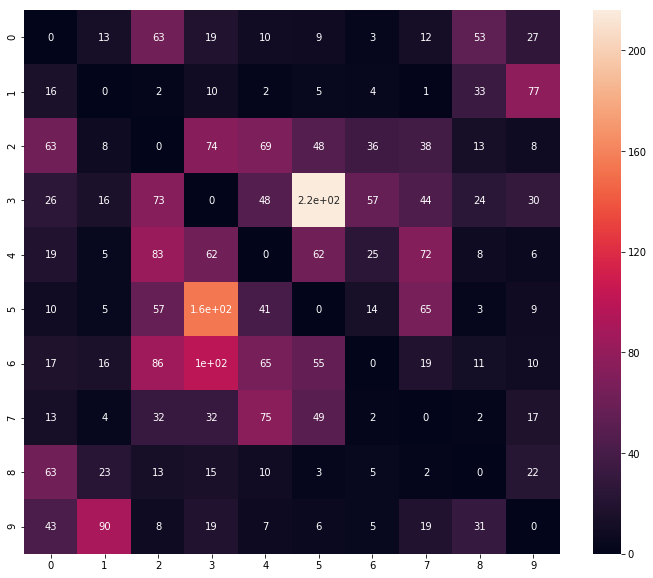

In [45]:
plot_errors(model)

# Отрисуем архитектуру модели


(dot.exe:2408): Pango-WARNING **: couldn't load font "Times Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


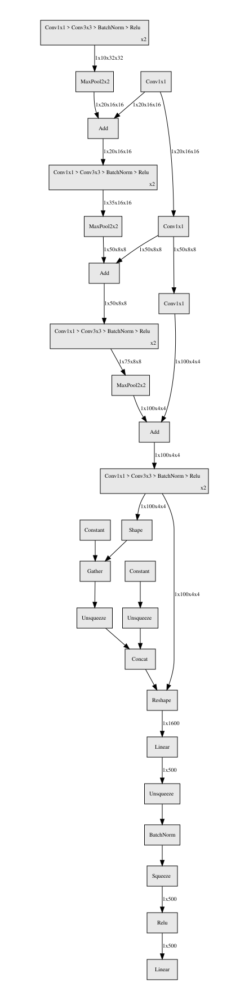

In [46]:
plot_architecture(model)

Бонусом также дам ссылку на <a href="https://habr.com/ru/post/347564/">статью на Хабре про Xception</a> (мопед не мой).

Подобная архитектура блоков также используется в Inception-ResNet.

# MobileNet

Глубокое обучение показало свою работоспособность в решении огромного ряда задач. Однако, у него был существенный недостаток -- масштабируемость. Обучать и применять глубокие нейронные сети можно было только на хороших компьютерах с мощным процессором, видеокартой и с кучей оперативной памяти. Одновременно с этим развивался также рынок мобильных устройств -- смартфонов и планшетов. Естественным желанием было заставить нейросети работать даже на таких устройствах. И пусть качество будет немного хуже, чем у топовых архитектур, зато модели будут легковесными и быстрыми. В 2017 в Google была создана архитектура MobileNet, которая могла справиться с этой задачей. Хоть качество этой модели и уступало топовым архитектурам, и было сравнимо c ResNet-18 и превосходило из топовых архитектур разве что с Inception-V1 (GoogLeNet), количество весов и сложность вычислений в данной модели были существенно меньше, чем у всех существующих архитектур. 

В данной сети используется используются Depthwise Separable Convolution, который я описывал, когда говорил про Xception, в котором на каждой из итераций применяется батч-нормализация и активация. Также вместо обычной операции пуллинга, которая применялась в предыдущих сетях, в данной сети используется свертка 3х3 с параметром сдвига stride=2. Также из в отличие от предыдущих архитектур (в некоторых их который это в оригинале также применялось), после последнего сверточнго слоя применим GlobalAveragePooling, который берет среднее значение признака на каждом из слоев. На картинке ниже показана работа GlobalAveragePooling, где усреднение происходит по значениям одного цвета на исходном изображении, и в результате получается итоговое. Данная идея будет использоваться позже в SE-блоках, но об этом дальше.


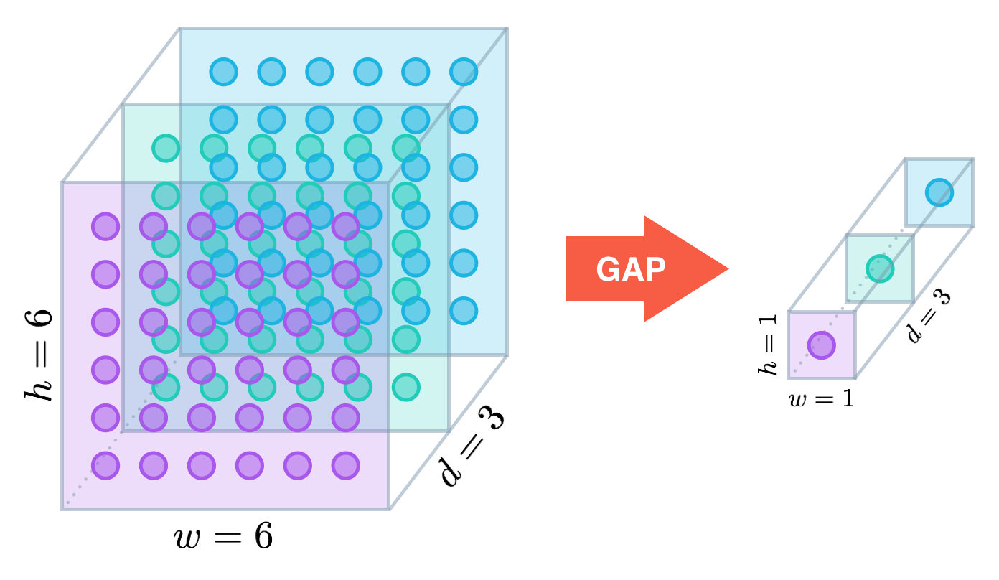

Полная архитектура сети выглядит как на рисунке ниже. Она состоит просто из последовательно применённых сверточных слоев. Ну и, конечно, <a href="https://arxiv.org/pdf/1704.04861.pdf">ссылка на статью</a>.

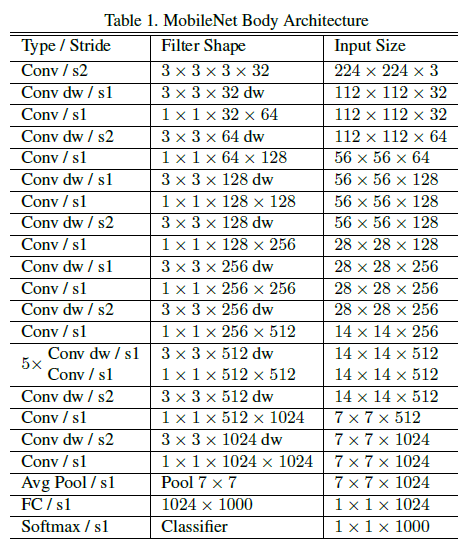

Так выглядела архитектура сети MobileNet V1. Несмотря на малое количество весов и хорошую скорость работы, по смыслу она была ближе всего к архитектуре VGG, а VGG большая, тяжелая и проигрывает тому же ResNet-18 по всем остальным параметрам при том же качестве. Поэтому предлагается применять residual-связи. При этом, для извлечения большего количества признаков используется вариация Depthwise Seprable Convolution и Extreme Convolution, названная Linear Bottlenecks. В начале блока, как в Extreme Inception выполняется свертка по каналам, в которой выполняется увеличение числа признаков в t раз, где t -- коэффициент расширения. Затем по каждой из полученных карт признаков выполняется свертка размером 3х3 -- Depthwise Convolution. Далее снова идет свертка по каналам, но на этот раз число каналов снова сжимается до исходного. Таким образом, в каждом блоке Linear Bottleneck число каналов не меняется, а это значит, что можно использовать residual-связи. Для сжатия используется похожая архитектура, только количество выходных каналов в данном случае меняется. Архитектура блоков показана ниже.

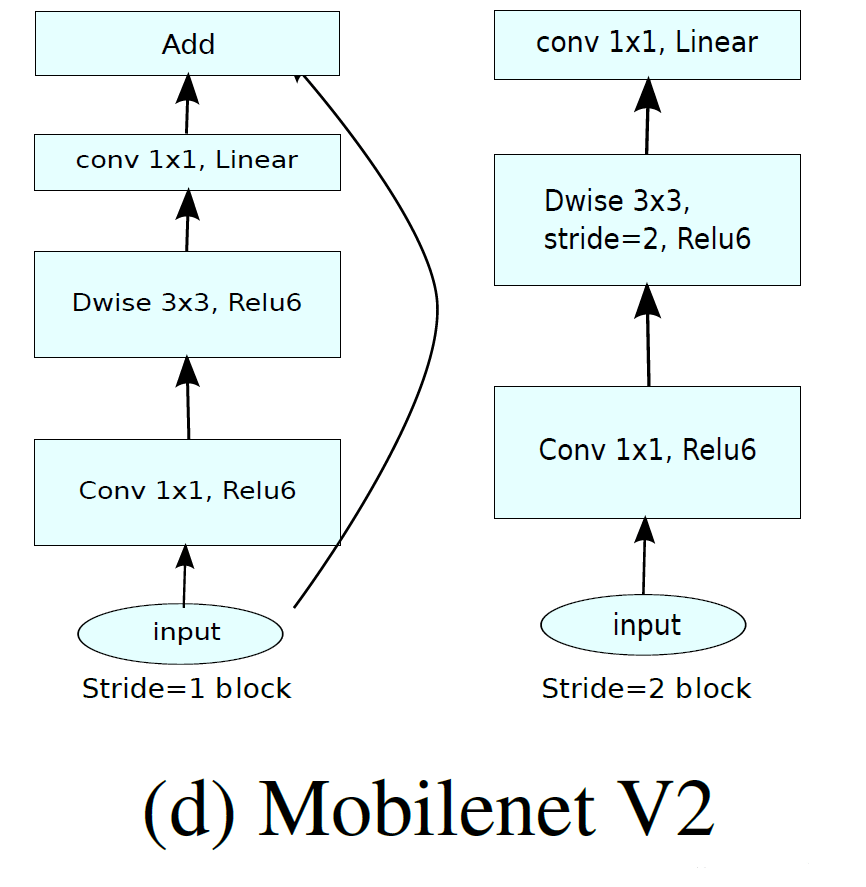

Теперь сеть стала еще проще, быстрее и компактнее. Архитектура подробно описана в <a href="https://arxiv.org/pdf/1801.04381.pdf#page=10&zoom=100,0,522">статье</a>.

In [47]:
class LinearBottleneck(nn.Module):
    def __init__(self, input_shape, expansion_factor, output_shape=None, stride=1):
        super(LinearBottleneck, self).__init__()
        
        self.activation = nn.ReLU6()
        
        num_layers = input_shape*expansion_factor
        output_shape = output_shape or input_shape
    
        self.conv_1 = nn.Conv2d(input_shape, num_layers, 1)
        self.conv_2 = nn.Conv2d(num_layers, num_layers, 3, stride, 1, groups=num_layers)
        self.conv_3 = nn.Conv2d(num_layers, output_shape, 1)
        
        self.bn_1 = nn.BatchNorm2d(num_layers)
        self.bn_2= nn.BatchNorm2d(num_layers)
        self.bn_3= nn.BatchNorm2d(output_shape)
        
    def forward(self, x):
        # pointwise
        h = self.conv_1(x)
        h = self.bn_1(h)
        h = self.activation(h)
        # depthwise
        h = self.conv_2(h)
        h = self.bn_2(h)
        h = self.activation(h)
        #pointwise
        h = self.conv_3(h)
        h = self.bn_3(h)
        return h
                        

In [48]:
class MobileNet(nn.Module):
    def __init__(self):
        super(MobileNet, self).__init__()
        
        self.activation = nn.ReLU6()
        
        self.conv_0 = LinearBottleneck(3, 5, 20)
        
        self.conv_1 = Residual(LinearBottleneck(20, 5))
        self.conv_2 = Residual(LinearBottleneck(20, 5))
        
        self.conv_3 = LinearBottleneck(20, 5, 50, 2)
        
        self.conv_4 = Residual(LinearBottleneck(50, 5))
        self.conv_5 = Residual(LinearBottleneck(50, 5))
        
        self.conv_6 = LinearBottleneck(50, 5, 100, 2)
        
        self.conv_7 = Residual(LinearBottleneck(100, 5))
        self.conv_8 = Residual(LinearBottleneck(100, 5))
        
        self.conv_9 = LinearBottleneck(100, 5, 200, 2)
        
        self.pool = nn.AvgPool2d(8)
                          
        self.dense_1 = nn.Linear(200, 500)
        self.bn = nn.BatchNorm1d(500)
        self.dense_2 = nn.Linear(500, 10)
                          
    def forward(self, x):
        h = self.activation(self.conv_0(x))
        h = self.activation(self.conv_1(h))
        h = self.activation(self.conv_2(h))
        h = self.activation(self.conv_3(h))
        h = self.activation(self.conv_4(h))
        h = self.activation(self.conv_5(h))
        h = self.activation(self.conv_6(h))
        h = self.activation(self.conv_7(h))
        h = self.activation(self.conv_8(h))
        h = self.activation(self.conv_9(h))
        h = self.pool(h).view(x.size()[0], -1)
        h = self.activation(self.dense_1(h))
        h = self.bn(h)
        return self.dense_2(h)

Epoch 16: trining loss=0.30867967814207076; test loss=0.4011419885903597
Learninig rate: 1.0000000000000002e-07
Iteration took 274.9214971065521s.


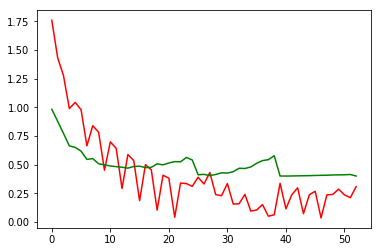

Early stop at 53000
Wall time: 4h 4min 58s


In [47]:
%%time
model = MobileNet()
if is_cuda:
    model.to("cuda:0")

train(model, train_path, test_path, 50, 16, "bn_mobnet.torch", lr_start=1e-3)

## Тестируем модель

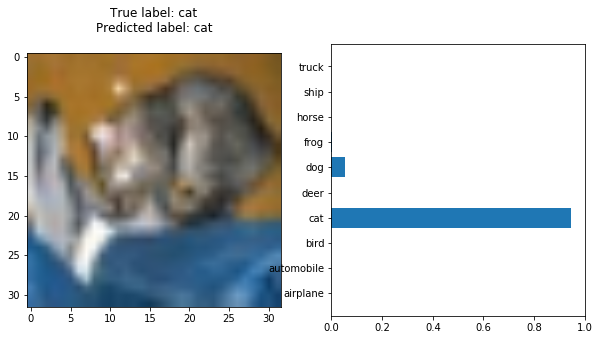

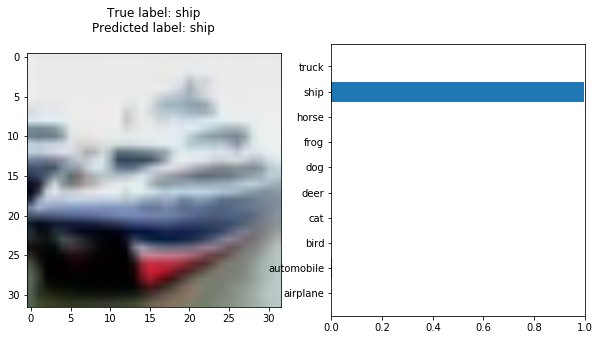

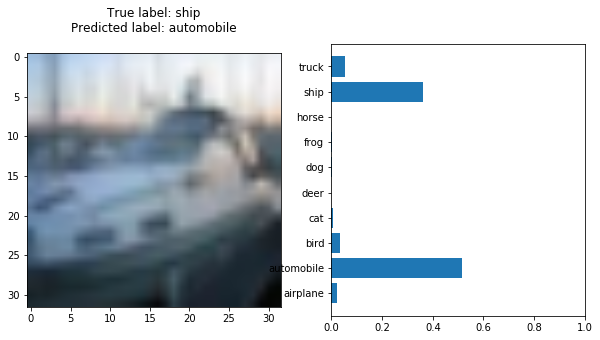

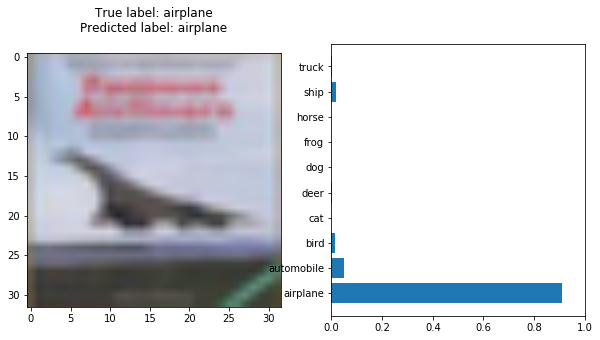

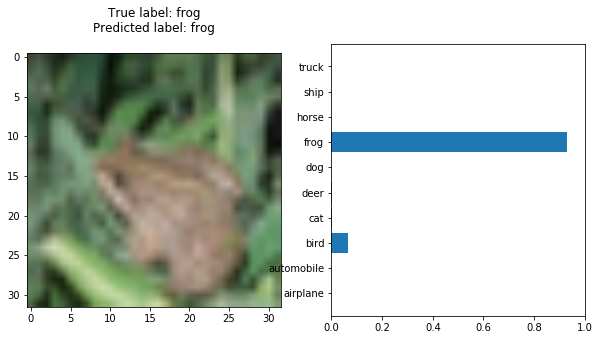

...

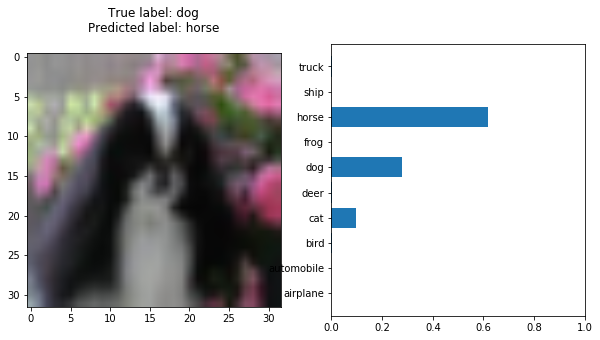

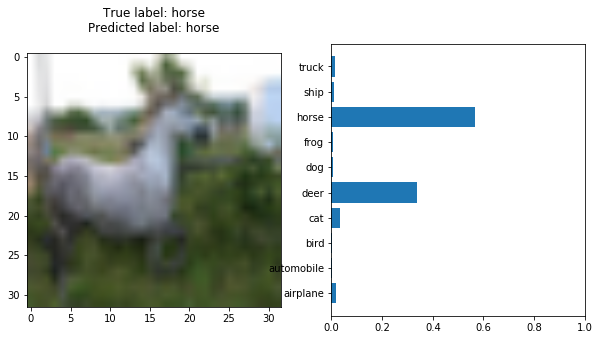

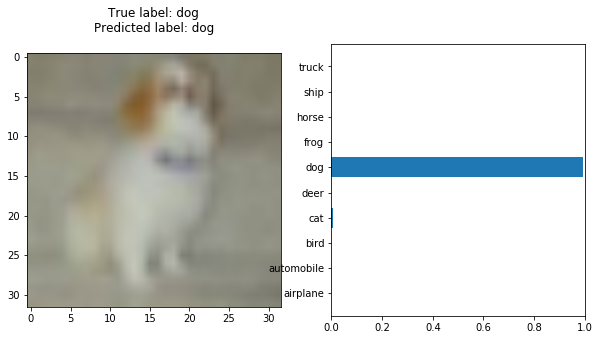

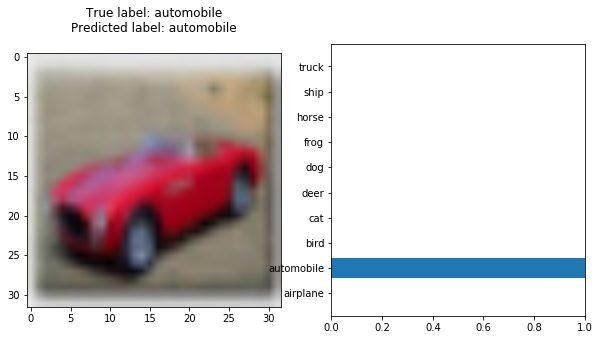

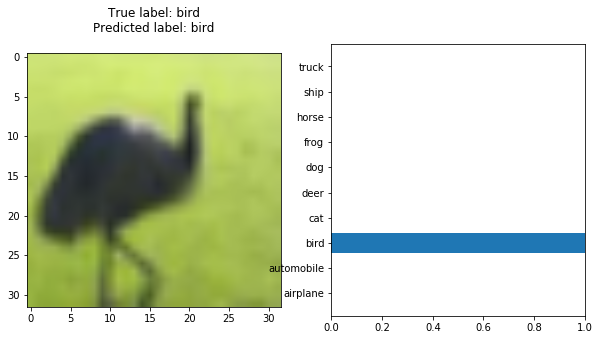

In [49]:
model = torch.load("bn_mobnet.torch")

model.eval()
test_model(model)

Top-1 Accuracy: 0.8139


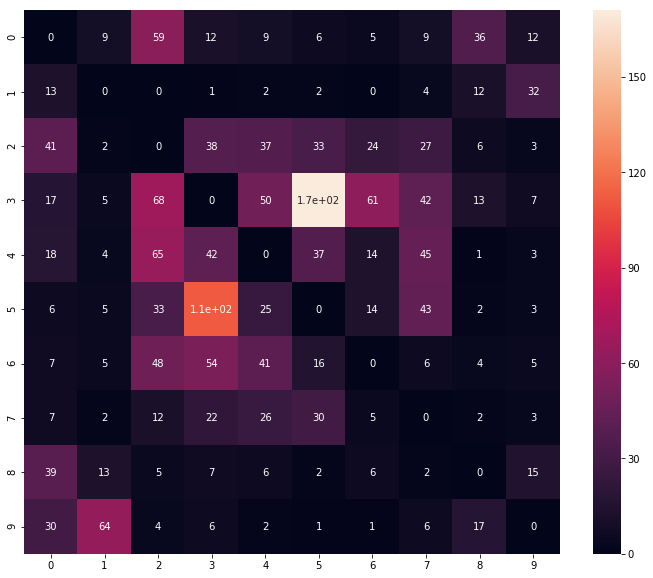

In [50]:
plot_errors(model)

# Отрисуем архитектуру модели


(dot.exe:14900): Pango-WARNING **: couldn't load font "Times Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


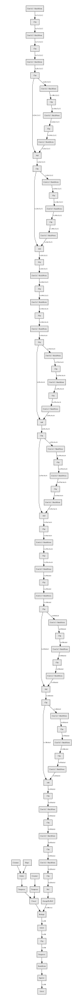

In [51]:
plot_architecture(model)

Не сказать, что на моем компьютере эта модель обучается и предсказывает быстро, но дает второе качество среди всех моделей выше после DenseNet, у которого весов в 2 раза больше, будучи при этом второй по количеству весов после Inception, который показал далеко не лучшее качество. Но здесь можно списать на не самую корректную постановку эксперимента с обучением. 

Про эту сеть также есть <a href="https://habr.com/ru/post/352804/">статейка на Хабре</a> от того же автора, что и про Xception.

# ResNeXt

Для уменьшения количества весов в ResNet используется метод Bottleneck. Он похож на тот, что используется в MobileNet, размерность пространства при этом не увеличивается, а уменьшается, таким образом свертки 3x3, которые в отличие от MobileNet не являются Depthwise, не требуют такого большого количества весов. В архитектуре болка ResNeXt используются независимые свертки, но применяются они одновременно к группе каналов. Количество параллельных групп определяется параметром cardinality. Архитектура блока изображена на схеме. 

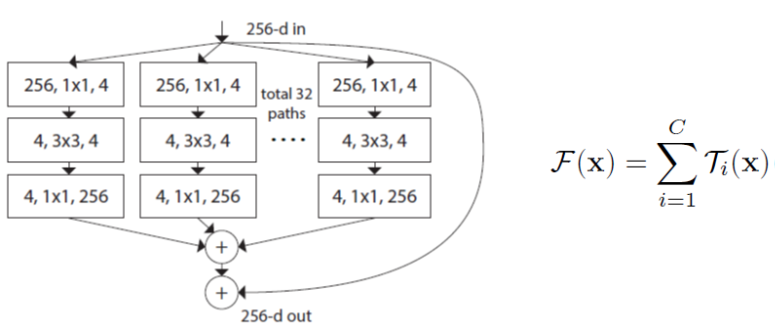

Архитектура описана в [статье](https://arxiv.org/pdf/1611.05431.pdf).

Реализуем архитектуру ResTeXt. Параллельные блоки будут реализованы при помощи параметра groups в свертке.

In [62]:
class Bottleneck(nn.Module):
    def __init__(self, input_shape, expansion_factor, cardinality=None, output_shape=None, stride=1):
        super(Bottleneck, self).__init__()
        
        self.activation = nn.ReLU6()
        
        num_layers = input_shape//expansion_factor
        output_shape = output_shape or input_shape
        cardinality = cardinality or 1
    
        self.conv_1 = nn.Conv2d(input_shape, num_layers, 1)
        self.conv_2 = nn.Conv2d(num_layers, num_layers, 3, stride, 1, groups=cardinality)
        self.conv_3 = nn.Conv2d(num_layers, output_shape, 1)
        
        self.bn_1 = nn.BatchNorm2d(num_layers)
        self.bn_2= nn.BatchNorm2d(num_layers)
        self.bn_3= nn.BatchNorm2d(output_shape)
        
    def forward(self, x):
        # pointwise
        h = self.conv_1(x)
        h = self.bn_1(h)
        h = self.activation(h)
        # depthwise
        h = self.conv_2(h)
        h = self.bn_2(h)
        h = self.activation(h)
        #pointwise
        h = self.conv_3(h)
        h = self.bn_3(h)
        return h
                        

In [63]:
class ResNeXt(nn.Module):
    def __init__(self):
        super(ResNeXt, self).__init__()
        
        self.activation = nn.ReLU6()
        
        self.conv_0 = Bottleneck(3, 1, output_shape=20)
        
        self.conv_1 = Residual(Bottleneck(20, 1, 5))
        self.conv_2 = Residual(Bottleneck(20, 1, 5))
        
        self.conv_3 = Bottleneck(20, 1, output_shape=50, stride=2)
        
        self.conv_4 = Residual(Bottleneck(50, 1, 10))
        self.conv_5 = Residual(Bottleneck(50, 1, 10))
        
        self.conv_6 = Bottleneck(50, 1, output_shape=100, stride=2)
        
        self.conv_7 = Residual(Bottleneck(100, 1, 20))
        self.conv_8 = Residual(Bottleneck(100, 1, 20))
        
        self.conv_9 = Bottleneck(100, 1, output_shape=200, stride=2)
        
        self.pool = nn.AvgPool2d(8)
                          
        self.dense_1 = nn.Linear(200, 500)
        self.bn = nn.BatchNorm1d(500)
        self.dense_2 = nn.Linear(500, 10)
                          
    def forward(self, x):
        h = self.activation(self.conv_0(x))
        h = self.activation(self.conv_1(h))
        h = self.activation(self.conv_2(h))
        h = self.activation(self.conv_3(h))
        h = self.activation(self.conv_4(h))
        h = self.activation(self.conv_5(h))
        h = self.activation(self.conv_6(h))
        h = self.activation(self.conv_7(h))
        h = self.activation(self.conv_8(h))
        h = self.activation(self.conv_9(h))
        h = self.pool(h).view(x.size()[0], -1)
        h = self.activation(self.dense_1(h))
        h = self.bn(h)
        return self.dense_2(h)

Epoch 17: trining loss=0.49252062086761; test loss=0.4570966827124357
Learninig rate: 1.0000000000000002e-07
Iteration took 132.71578550338745s.


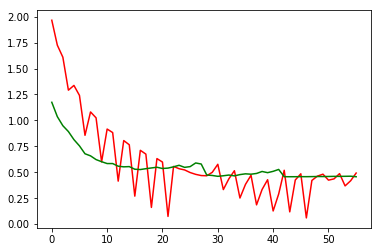

Early stop at 56000
Wall time: 2h 3min 55s


In [64]:
%%time
model = ResNeXt()
if is_cuda:
    model.to("cuda:0")

train(model, train_path, test_path, 50, 16, "bn_resnext.torch", lr_start=1e-3)

## Тестируем модель

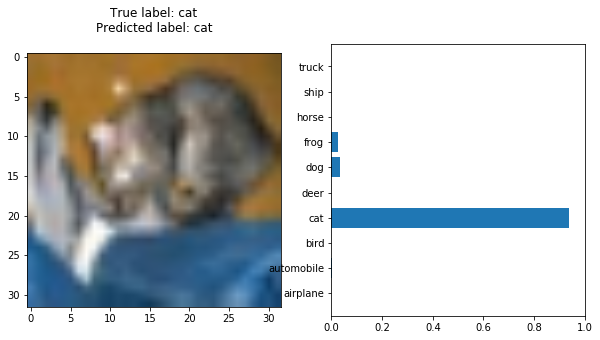

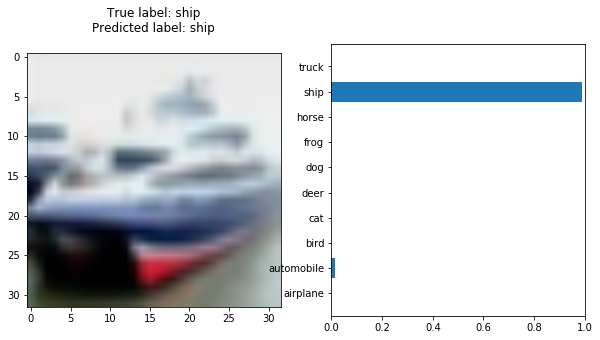

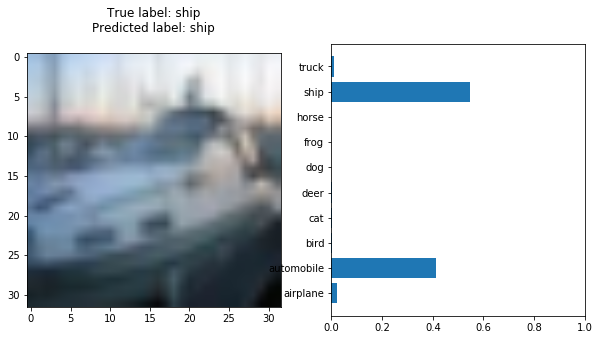

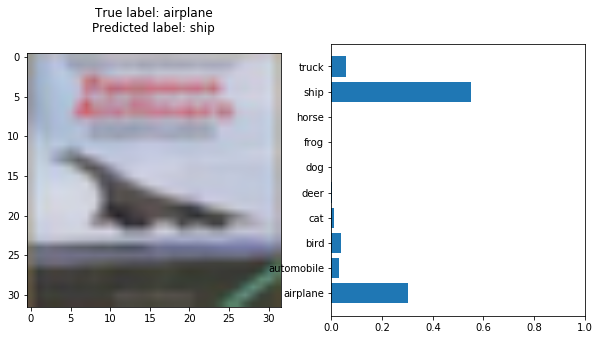

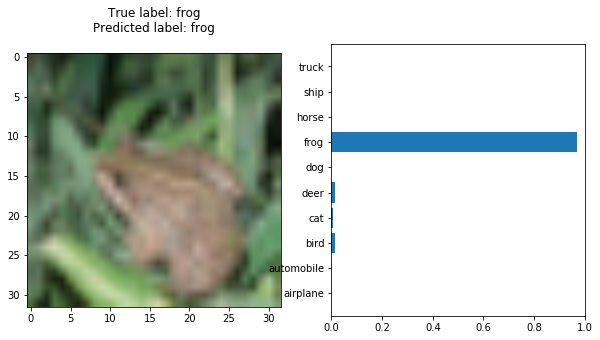

...

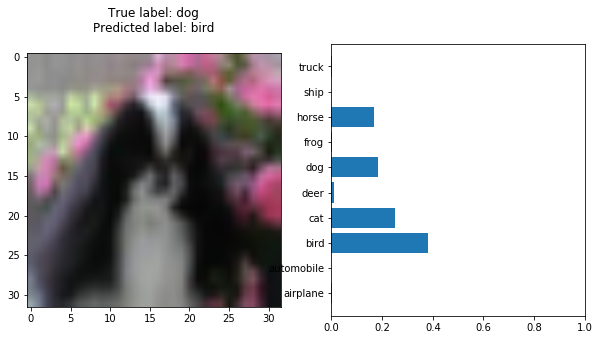

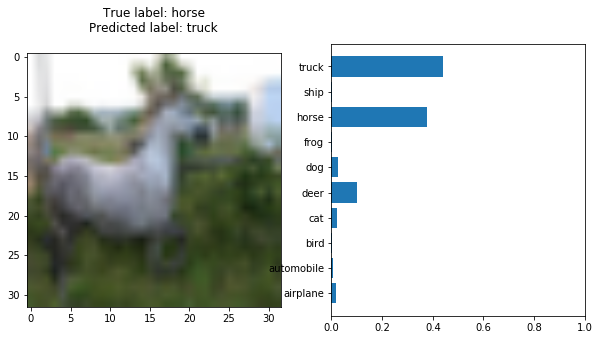

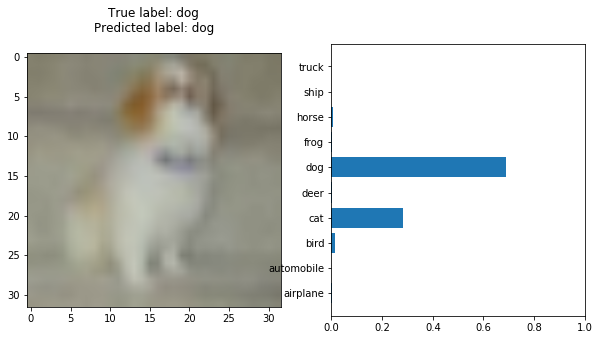

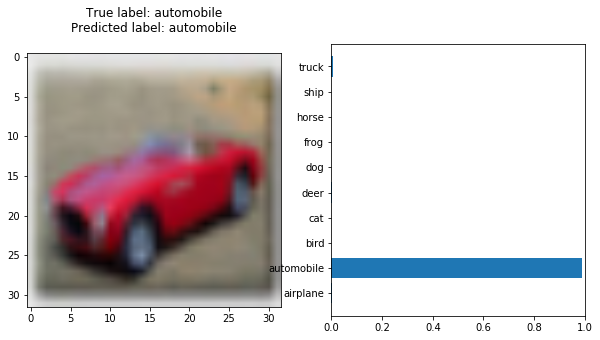

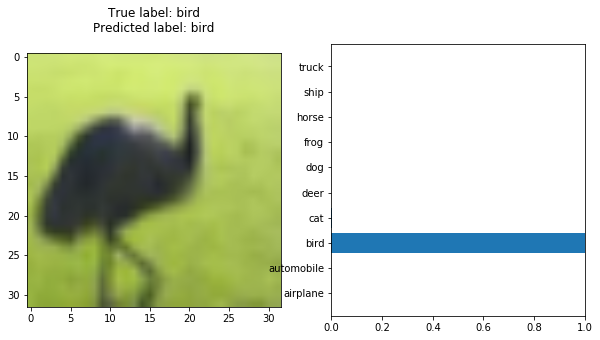

In [65]:
model = torch.load("bn_resnext.torch")

model.eval()
test_model(model)

Top-1 Accuracy: 0.7766


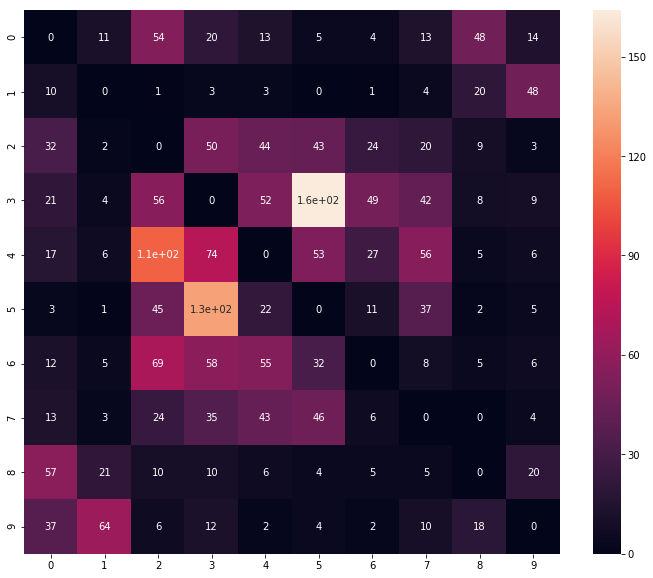

In [66]:
plot_errors(model)

# Отрисуем архитектуру модели


(dot.exe:10648): Pango-WARNING **: couldn't load font "Times Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


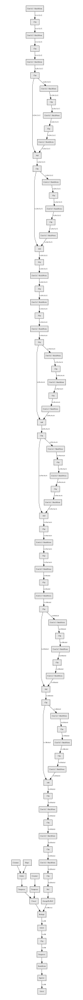

In [67]:
plot_architecture(model)

# SENet

В сверточных слоях не все каналы одинаково полезны для решения задачи. Поэтому возникает идея учитывать разные каналы с разным весом в каждом конкретном случае. Таким образом можно попытаться выделить из изображения существенную информацию и избавиться от менее существенной. Для этого применяется squeeze and excitation блок. Он принимает на вход изображение и выполняет нормировку его каналов. Веса выбираются исходя из текущих значений каналов. Для получения информации о канале выполняется глобальное усреднение, затем при помощи плотной сети выполняется предсказание весов слоя. Полученные веса умножаются на значение слоя. Архитектуру блока можно понять из схемы ниже.

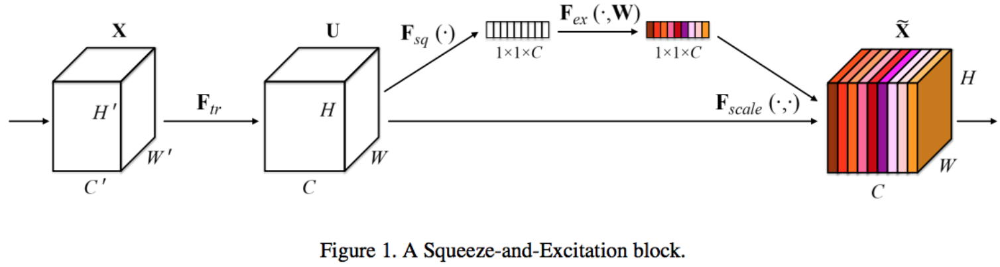

Она подробно описана в [статье](https://arxiv.org/pdf/1709.01507.pdf)

Реализация данной сети чем-то похожа на Network in Network. Добавим SE блок к обычному LeNet c BN.

In [102]:
class SEBlock(nn.Module):
    def __init__(self, num_channels):
        super(SEBlock, self).__init__()
        
        self.lin1 = nn.Conv2d(num_channels, num_channels, 1)
        self.lin2 = nn.Conv2d(num_channels, num_channels, 1)

    def forward(self, x):
        h = nn.functional.avg_pool2d(x, int(x.size()[2]))
        
        h = torch.relu(self.lin1(h))
        h = torch.sigmoid(self.lin2(h))
        
        return x*h

In [103]:
class SE_LeNet(nn.Module):
    def __init__(self):
        super(SE_LeNet, self).__init__()
        
        self.conv_1 = nn.Conv2d(3, 20, 5, padding=2)                         
        self.bn_1 = nn.BatchNorm2d(20)                
        self.se_1 = SEBlock(20)
        self.mp_1 = nn.MaxPool2d(2)                   
        
        self.conv_2 = nn.Conv2d(20, 50, 3, padding=1) 
        self.bn_2 = nn.BatchNorm2d(50) 
        self.se_2 = SEBlock(50)
        self.mp_2 = nn.MaxPool2d(2)
        
        self.conv_3 = nn.Conv2d(50, 100, 3, padding=1) 
        self.bn_3 = nn.BatchNorm2d(100)
        self.se_3 = SEBlock(100)
        self.mp_3 = nn.MaxPool2d(2)
        
        self.dense_1 = nn.Linear(16*100, 500)          
        self.bn_4 = nn.BatchNorm1d(500)                
        self.dense_2 = nn.Linear(500, 10)
        
    def forward(self, x):
        # layer 1
        h = self.conv_1(x)           
        h = self.bn_1(h)
        torch.relu_(h) 
        h = self.se_1(h)
        h = self.mp_1(h)    
        # layer 2
        h = self.conv_2(h)
        h = self.bn_2(h)
        torch.relu_(h)
        h = self.se_2(h)
        h = self.mp_2(h)
        # layer 3
        h = self.conv_3(h)
        h = self.bn_3(h)
        torch.relu_(h)
        h = self.se_3(h)
        h = self.mp_3(h)
        # flatten
        h = h.view(x.shape[0], -1)   
        #hidden
        h = self.dense_1(h)        
        h = self.bn_4(h)
        torch.relu_(h)         
        logits = self.dense_2(h)
        return logits

Epoch 19: trining loss=0.3971811433658004; test loss=0.4452147578522563
Learninig rate: 1.0000000000000002e-07
Iteration took 33.1523711681366s.


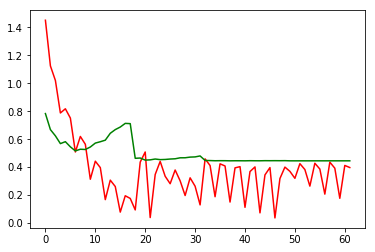

Early stop at 62000
Wall time: 35min 42s


In [75]:
%%time
model = SE_LeNet()
if is_cuda:
    model.to("cuda:0")

train(model, train_path, test_path, 50, 16, "se_lenet.torch", lr_start=1e-3)

## Тестируем модель

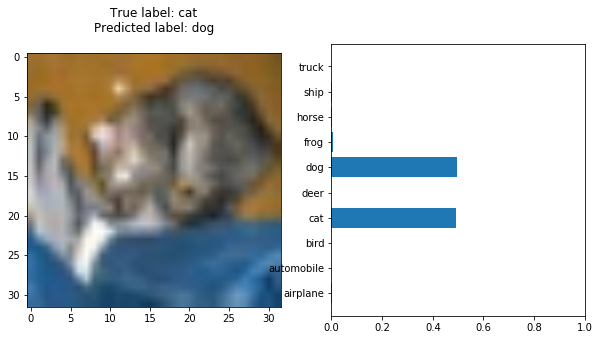

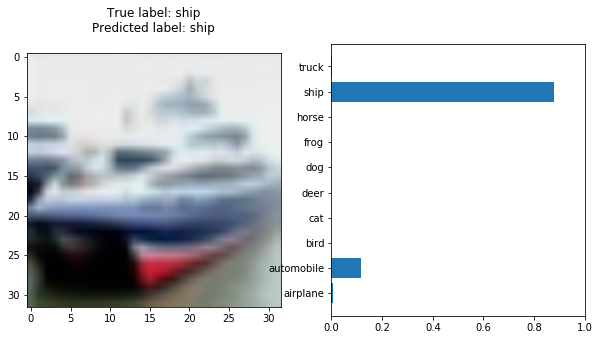

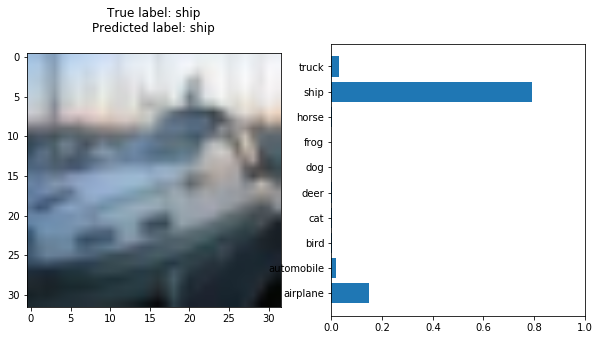

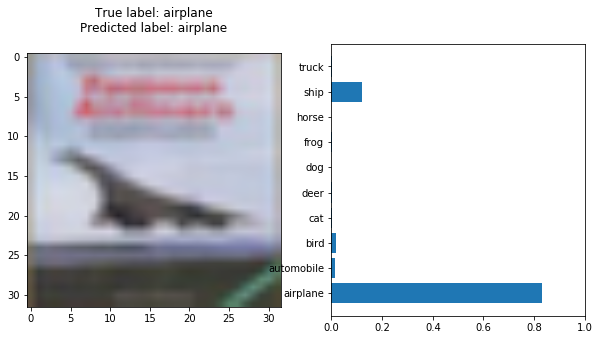

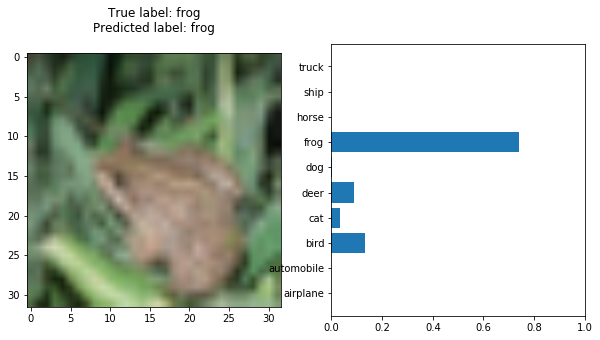

...

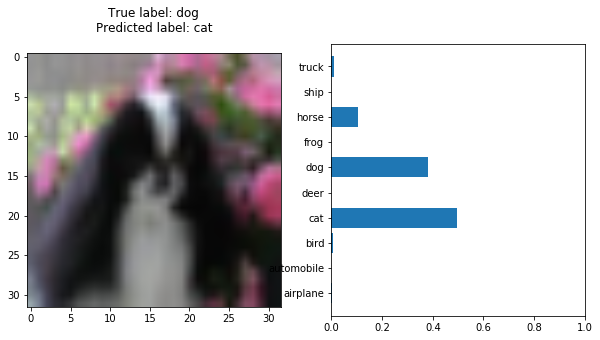

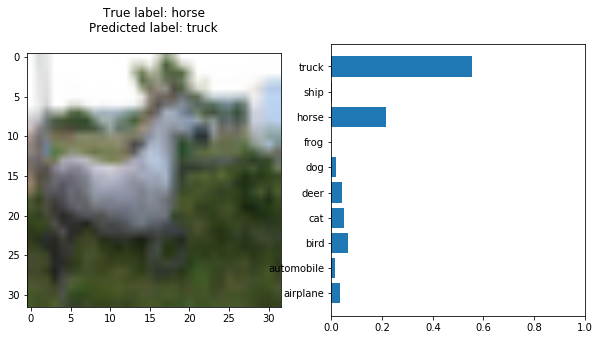

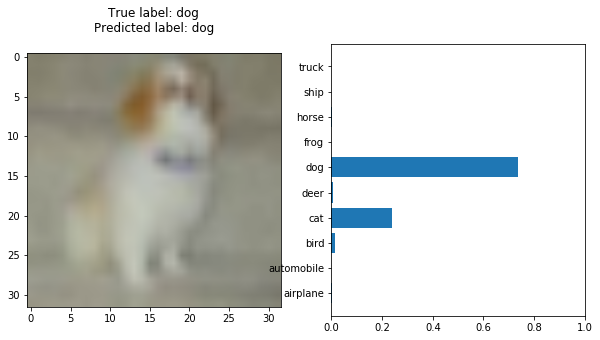

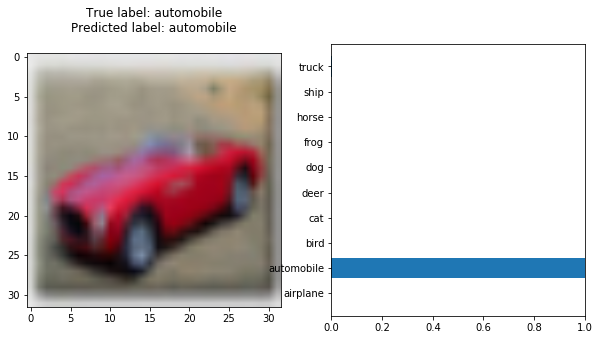

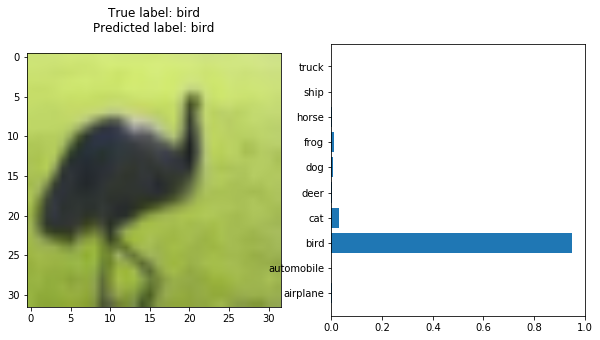

In [104]:
model = torch.load("se_lenet.torch")

model.eval()
test_model(model)

Top-1 Accuracy: 0.7815


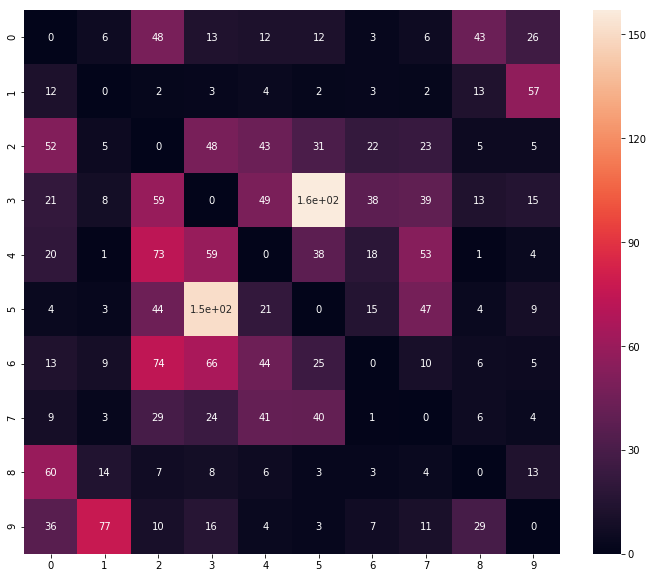

In [105]:
plot_errors(model)

# Отрисуем архитектуру модели

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: TracerWarning: Converting a tensor to a Python integer might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if __name__ == '__main__':

(dot.exe:3360): Pango-WARNING **: couldn't load font "Times Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


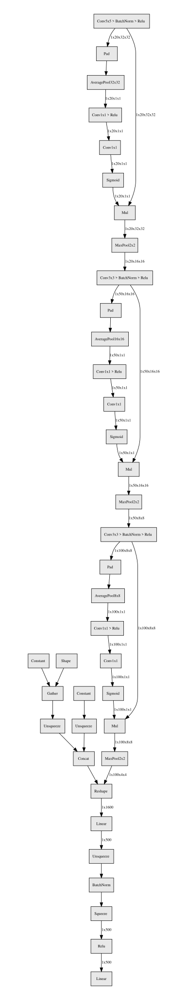

In [106]:
plot_architecture(model)